<center> <img src="https://d3i71xaburhd42.cloudfront.net/261c3e30bae8b8bdc83541ffa9331b52fcf015e6/3-Figure2-1.png" width=50% > </center>

<br><br>

<center> 
    <font size="6">Lab 1: Colour, Intrinsic Image Decomposition & Photometric Stereo</font> 
</center>
<center> 
    <font size="4">Computer Vision 1 University of Amsterdam</font> 
</center>
<center> 
    <font size="4">Due 23:59, September 13, 2024 (Amsterdam time)</font> 
</center>
<center> 
    <font size="4"><b>TA's: Xiaoyan, Floris, Adrian</b></font>
</center>

<br><br>

***

<br><br>

<center>

Student1 ID:  15388867 \
Student1 Name: Jose Garcia

Student2 ID: \
Student2 Name: Lisanne Wallaard

Student3 ID: \
Student3 Name: Julio Smidi

( Student4 ID: \
Student4 Name: )

</center>

### **Import Libraries**

In [1]:
import sys

if sys.version_info[0] < 3:
    raise Exception("Python 3 or a more recent version is required.")

In [2]:
# environment and libraries
import os
import glob
import numpy as np
import random
import cv2
import matplotlib
import matplotlib.pyplot as plt

import warnings
warnings.simplefilter(action = "ignore", category = RuntimeWarning)
warnings.simplefilter(action = "ignore", category = UserWarning)

from mpl_toolkits.mplot3d import Axes3D

In [3]:
# Make sure you're using the provided environment!
assert cv2.__version__ == "4.10.0", "You're not using the provided Python environment!"
assert np.__version__ == "1.26.4", "You're not using the provided Python environment!"
assert matplotlib.__version__ == "3.9.2", "You're not using the provided Python environment!"
# Proceed to the next cell if you don't get any error.

### **Instructions**

Your code and discussion must be handed in this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 1 Assignment. Please also fill out your names and ID's above.

For full credit, make sure your notebook follows these guidelines:
- It is mandatory to **use the Python environment provided** with the assignment; the environment specifies the package versions that have to be used to prevent the use of particular functions. Using different packages versions may lead to grade deduction. In the Python cell above you can check whether your environment is set up correctly.
- To install the environment with the right package versions, use the following command in your terminal: ```conda env create --file=cv1_environment.yaml```, then activate the environment using the command ```conda activate cv1```.
- Do not use additional packages or materials that have not been provided or explicitly mentioned.
- Please express your thoughts **concisely**. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions and sub-questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make the notebook self-contained and complete.
- Tables and figures must be accompanied by a **brief** description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

__Note:__ A more complete overview of the lab requirements can be found in the Course Manual on Canvas

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.

Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations. This includes the use of generative tools such as ChatGPT.

**ENSURE THAT YOU SAVE ALL RESULTS / ANSWERS ON THE QUESTIONS (EVEN IF YOU RE-USE SOME CODE).**

### **Overview**

- [Section 1: Colour Spaces (13 points)](#section-1)
  - [Question 1 (2 points)](#question-1)
  - [Question 2 (6 points)](#question-2)
  - [Question 3 (2 points)](#question-3)
  - [Question 4 (2 points)](#question-4)
  - [Question 5 (1 point)](#question-5)
- [Section 2: Colour Constancy (13 points)](#section-2)
  - [Question 6 (8 points)](#question-6)
  - [Question 7 (2 points)](#question-7)
  - [Question 8 (3 points)](#question-8)
- [Section 3: Intrinsic Image Decomposition (14 points)](#section-3)
  - [Question 9 (2 points)](#question-9)
  - [Question 10 (2 points)](#question-10)
  - [Question 11 (4 points)](#question-11)
  - [Question 12 (2 points)](#question-12)
  - [Question 13 (2 points)](#question-13)
  - [Question 14 (2 points)](#question-14)
- [Section 4: Photometric Stereo (60 points)](#section-4)
  - [Question 15 (4 points)](#question-15)
  - [Question 16 (2 points)](#question-16)
  - [Question 17 (1 point)](#question-17)
  - [Question 18 (2 points)](#question-18)
  - [Question 19 (2 points)](#question-19)
  - [Question 20 (5 points)](#question-20)
  - [Question 21 (3 points)](#question-21)
  - [Question 22 (6 points)](#question-22)
  - [Question 23 (2 points)](#question-23)
  - [Question 24 (3 points)](#question-24)
  - [Question 25 (3 points)](#question-25)
  - [Question 26 (2 points)](#question-26)
  - [Question 27 (4 points)](#question-27)
  - [Question 28 (5 points)](#question-28)
  - [Question 29 (2 points)](#question-29)
  - [Question 30 (2 points)](#question-30)
  - [Question 31 (4 points)](#question-31)
  - [Question 32 (1 point)](#question-32)
  - [Question 33 (2 points)](#question-33)
  - [Question 34 (2 points)](#question-34)
  - [Question 35 (1 point)](#question-35)
  - [Question 36 (4 points)](#question-36)
  - [Question 37 (1 point)](#question-37)
- [Section X: Individual Contribution Report (Mandatory)](#section-x)

<a id="section-1"></a>
### **Section 1: Colour Spaces**

In this part of the assignment, you will study the different colour spaces for image representations and experiment how to convert a given RGB image to a specific colour space

<a id="question-1"></a>
#### <font color='#FF0000'>Question 1 (2 points)</font>

Why do we use the RGB color model as the basis for our digital cameras and photography? How does a standard digital camera capture a full RGB color image?

##### <font color='yellow'>Answer:</font>

In "Digitial Image Processing" by Rafael C. Gonzalez & Richard E. Woods it is mentioned that the cones in the human eyes have three kinds of sensors for the primary colors (red, green, blue). The colors we observe are a combination of those three primary colors. By using the RGB color model as basis for digitial cameras & photography, it tries to copy the human eye as good as possible in order to create pictures that seem natural. A standerd digital camera captures a full RGB color image by three components, each component represent a primary color. The pixels of each component consist of values [0,1] for floats or [0,255] for integers that represent the intensity of that primary color. The three components are merged together to create the color image. In "Computer Vision: Algorithms and Applications" by Richard Szeliski it is explained that the Bayer pattern is used for this in the camera: 50% of the sensors in the camera are green, the other half is red and blue. The green filter captures the luminance for the largest part, which is of great importance for our visual system.

<a id="question-2"></a>
#### <font color='#FF0000'>Question 2 (6 points)</font>

Create a function to convert an RGB image into various color spaces using the provided `convert_colour_space()` function and other sub-functions.

**Color Spaces to Convert:**

1. **Grayscale**

   Convert the RGB image into grayscale using 3 different methods mentioned in [John D. Cook's blog](https://www.johndcook.com/blog/2009/08/24/algorithms-convert-color-grayscale/). Additionally, check and report which method OpenCV uses for grayscale conversion, include it as well, and visualize all 4 methods in the same figure.

2. **Opponent Color Space**

   $\begin{pmatrix}
   O_1 \\
   O_2 \\
   O_3
   \end{pmatrix}$ = $\begin{pmatrix}
   \frac{R-G}{\sqrt{2}} \\
   \frac{R+G-2B}{\sqrt{6}} \\
   \frac{R+G+B}{\sqrt{3}}
   \end{pmatrix}$

3. **Normalized RGB (rgb) Color Space**

   $\begin{pmatrix}
   r \\
   g \\
   b
   \end{pmatrix}$ = $\begin{pmatrix}
   \frac{R}{R+G+B} \\
   \frac{G}{R+G+B} \\
   \frac{B}{R+G+B}
   \end{pmatrix}$

4. **HSV Color Space**

   Convert the RGB image into HSV Color Space using OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2HSV)*.

5. **YCbCr Color Space**

   Convert the RGB image into YCbCr Color Space using OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2YCrCb)*. Arrange the channels in $Y, C_b,$ and $C_r$ order.

**Note:** 

- Ensure you understand the data types and ranges required by the Python conversion and image displaying functions. This usually means [0, 1] for float datatype or [0, 255] for integer datatype. Explicitly change the datatype if necessary.

- Each color space may have its own visualization requirements. For instance, think about how to meaningfully visualize the H, S, and V channels. Ensure each channel is visualized in an RGB manner where applicable.

**Extra:** It might be interesting to visualize the image in its original color space (RGB) as well.

In [4]:
def convert_rgb_to_grays(input_image):
    '''
    Converts an RGB image into grayscale using different methods and 
    returns the grayscale images stacked as separate channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing different grayscale conversion methods
    '''

    # convert input image to array format if not already
    height, width, _ = input_image.shape
    
    lightness = np.zeros((height, width))
    average = np.zeros((height, width))
    luminosity = np.zeros((height, width))    
    for h in range(height):
        for w in range(width):
            r = input_image[h,w,0]
            g = input_image[h,w,1]
            b = input_image[h,w,2]
            # lightness method
            lightness[h,w] = (max(r,g,b) + min(r,g,b)) / 2
            # average method
            average[h,w] = (r + g + b)  / 3
            # luminosity method
            luminosity[h,w] = 0.21*r + 0.72*g + 0.07*b

    # built-in OpenCV function
    opencv = cv2.cvtColor(input_image, cv2.COLOR_RGB2GRAY)
    
    # Convert values to intergers between 0 and 255
    lightness = cv2.normalize(lightness, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    average = cv2.normalize(average, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    luminosity = cv2.normalize(luminosity, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    opencv = cv2.normalize(opencv, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # stack the results to easily visualize the 4 different methods
    new_image = np.stack([lightness, average, luminosity, opencv], axis=-1)

    return new_image

In [5]:
def convert_rgb_to_opponent(input_image):
    '''
    Converts an RGB image into the opponent color space and 
    returns the image with opponent color channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing opponent color space
    '''
    # convert input image to array format if not already
    # image_rgb = plt.imread(input_image)
    height, width, color = input_image.shape
    
    new_image = np.zeros((height, width, color))
    for h in range(height):
        for w in range(width):
            r = input_image[h,w,0]
            g = input_image[h,w,1]
            b = input_image[h,w,2]
            new_image[h,w,0] = (r - g) / np.sqrt(2)
            new_image[h,w,1] = (r + g - 2*b) / np.sqrt(6)
            new_image[h,w,2] = (r + g + b) / np.sqrt(3)
            
    for c in range(color):
        cv2.normalize(new_image[:,:,c], None, 0, 255, cv2.NORM_MINMAX)
        
    new_image = new_image.astype(np.uint8)

    return new_image

In [6]:
def convert_rgb_to_normedrgb(input_image):
    '''
    Converts an RGB image into the normalized RGB (nrgb) color space and 
    returns the image with normalized RGB channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing normalized RGB color space
        
    '''
    
    # convert input image to array format if not already
    # image_rgb = plt.imread(input_image)
    height, width, color = input_image.shape
    
    new_image = np.zeros((height, width, color))
    for h in range(height):
        for w in range(width):
            r = input_image[h,w,0]
            g = input_image[h,w,1]
            b = input_image[h,w,2]
            new_image[h,w,0] = r / (r + g + b)
            new_image[h,w,1] = g / (r + g + b)
            new_image[h,w,2] = b / (r + g + b)
            
    
    new_image = cv2.normalize(new_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    
    return new_image

In [7]:
def convert_colour_space(input_image, colourspace):
    '''
    Converts an RGB image into a specified color space and 
    returns the image in its new color space.

    Args:
        input_image: RGB image
        colourspace: colour space to be converted to. 
        - choices: opponent, nrgb, hsv, ycbcr, grays

    Returns:
        new_image: image with channels in provided colour space
    '''

    # Convert the image into double precision for conversions
    input_image = input_image.astype(np.float32)

    if colourspace.lower() == 'opponent':
        # fill in the rgb2opponent function

        new_image = convert_rgb_to_opponent(input_image)

    elif colourspace.lower() == 'nrgb':
        # fill in the rgb2normedrgb function

        new_image = convert_rgb_to_normedrgb(input_image)

    elif colourspace.lower() == 'hsv':
        # use built-in function from opencv
        
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2HSV)
        new_image = cv2.normalize(new_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
        # print(new_image)

    elif colourspace.lower() == 'ycbcr':
        # use built-in function from opencv
        
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2YCrCb)
        new_image = cv2.normalize(new_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
        cr = new_image[:,:,1]
        cb = new_image[:,:,2]
        new_image[:,:,1] = cb
        new_image[:,:,2] = cr

    elif colourspace.lower() == 'grays':
        # fill in the rgb2grays function

        new_image = convert_rgb_to_grays(input_image)

    else:
        raise NotImplementedError('Unknown colorspace type [%s]...' % colourspace)

    return new_image

<a id="question-3"></a>
#### <font color='#FF0000'>Question 3 (2 points)</font>

Visualize the image in each new color space and its individual channels separately within the same figure. For example, for the HSV color space, visualize the converted HSV image and its Hue, Saturation, and Value channels separately (4 images in 1 figure). Ensure that the channel visualizations are **meaningful**.

The function `visualize_colourspace` below needs to be completed.

In [8]:
def visualize_colourspace(image, colourspace='rgb'):
    """
    Visualize the image in its corresponding colour space.
    This function visualizes 1 figure with 4 images.
    Hint: some RGB representation of the new colour space image + each of its channels

    Args:
        image: image with channels of some colour space
        colourspace: colour space to be converted to. 
        - choices: opponent, nrgb, hsv, ycbcr, grays
    """
    # Convert the colour space
    if colourspace != 'rgb':
        image = convert_colour_space(image, colourspace)
        
    # Create a figure with 4 subplots
    fig, ax = plt.subplots(1, 4)

    if colourspace == 'opponent':
        # Opponent Color Space
        ax[0].imshow(image)
        ax[0].set_title(f"{colourspace} color space")
        ax[0].axis('off')
        
        # O1, cmap='gray' to visualise intensity for O1
        O1 = np.zeros_like(image)
        O1[:,:,0] = image[:,:,0]
        ax[1].imshow(O1)
        ax[1].set_title('O_1 channel')
        ax[1].axis('off')

        # O2, cmap='gray' to visualise intensity for O2
        O2 = np.zeros_like(image)
        O2[:,:,1] = image[:,:,1]
        ax[2].imshow(O2)
        ax[2].set_title('O_2 channel')
        ax[2].axis('off')

        # O3, cmap='gray' to visualise intensity for O3
        O3 = np.zeros_like(image)
        O3[:,:,2] = image[:,:,2]
        ax[3].imshow(O3)
        ax[3].set_title('O_3 channel')
        ax[3].axis('off')

    elif colourspace in ['rgb', 'nrgb']:
        # (n)RGB Color Space
        ax[0].imshow(image)
        ax[0].set_title(f"{colourspace} color space")
        ax[0].axis('off')
        
        # Red channel, cmap='gray' to visualise intensity for red
        r = np.zeros_like(image)
        r[:,:,0] = image[:,:,0]
        ax[1].imshow(r)
        ax[1].set_title('Red Channel')
        ax[1].axis('off')

        # Green channel, cmap='gray' to visualise intensity for green
        g = np.zeros_like(image)
        g[:,:,1] = image[:,:,1]
        ax[2].imshow(g)
        ax[2].set_title('Green Channel')
        ax[2].axis('off')

        # Blue channel, cmap='gray' to visualise intensity for blue
        b = np.zeros_like(image)
        b[:,:,2] = image[:,:,2]
        ax[3].imshow(b)
        ax[3].set_title('Blue Channel')
        ax[3].axis('off')

    elif colourspace == 'hsv':       
        # HSV Color Space
        ax[0].imshow(image)
        ax[0].set_title(f"{colourspace} color space")
        ax[0].axis('off')
        
        # Hue channel, cmap='hsv' to visualise color
        # h = np.ones_like(image)
        # h[:,:,0] = image[:,:,0]
        ax[1].imshow(image[:,:,0])
        ax[1].set_title('Hue channel')
        ax[1].axis('off')

        # Saturation channel, cmap='gray' to visualise intensity
        # s = np.ones_like(image)
        # s[:,:,1] = image[:,:,1]
        ax[2].imshow(image[:,:,1], cmap='gray')
        ax[2].set_title('Saturation channel')
        ax[2].axis('off')

        # Value channel, cmap='gray' to visualise brightness
        # v = np.zeros_like(image)
        # v[:,:,2] = image[:,:,2]
        ax[3].imshow(image[:,:,2], cmap='gray')
        ax[3].set_title('Value channel')
        ax[3].axis('off')

    elif colourspace == 'ycbcr':        
        # YCbCr Color Space
        ax[0].imshow(image)
        ax[0].set_title(f"{colourspace} color space")
        ax[0].axis('off')
        
        # Y channel
        # y = np.zeros_like(image)
        # y[:,:,0] = image[:,:,0]
        ax[1].imshow(image[:,:,0], cmap='gray')
        ax[1].set_title('Y channel')
        ax[1].axis('off')

        # Cb channel
        cb = np.zeros_like(image)
        cb[:,:,2] = image[:,:,2]
        ax[2].imshow(cb)
        ax[2].set_title('Cb channel')
        ax[2].axis('off')

        # Cr channel
        cr = np.zeros_like(image)
        cr[:,:,0] = image[:,:,0]
        ax[3].imshow(cr)
        ax[3].set_title('Cr channel')
        ax[3].axis('off')

    elif colourspace == 'grays':
        # lightness image
        ax[0].imshow(image[:,:,0], cmap='gray')
        ax[0].set_title('Lightness')
        ax[0].axis('off')

        # average image
        ax[1].imshow(image[:,:,1], cmap='gray')
        ax[1].set_title('Average')
        ax[1].axis('off')

        # luminosity image
        ax[2].imshow(image[:,:,2], cmap='gray')
        ax[2].set_title('Luminosity')
        ax[2].axis('off')

        # opencv image
        ax[3].imshow(image[:,:,3], cmap='gray')
        ax[3].set_title('OpenCV')
        ax[3].axis('off')

    else:
        raise NotImplementedError('Unknown colorspace type [%s]...' % colourspace)
    
    plt.tight_layout()
    plt.show()

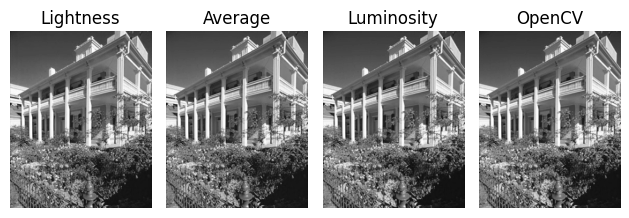

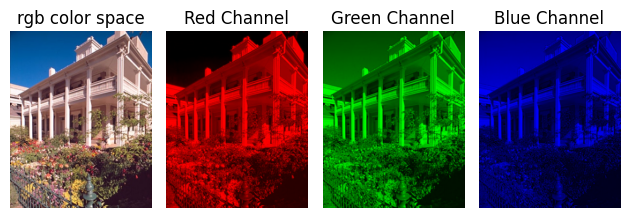

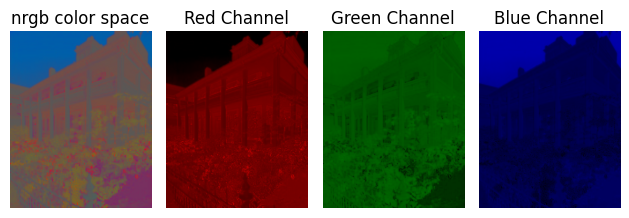

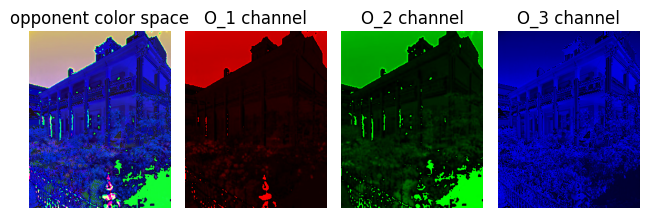

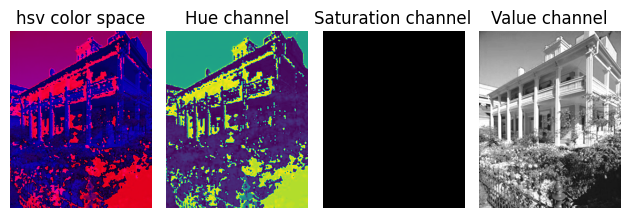

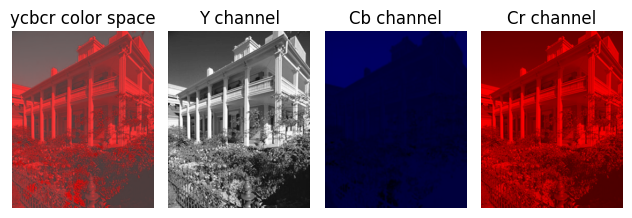

In [9]:
# Load and convert the image to RGB
image = cv2.imread('images/beehive_house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

visualize_colourspace(image, colourspace='grays')
visualize_colourspace(image, colourspace='rgb')
visualize_colourspace(image, colourspace='nrgb')
visualize_colourspace(image, colourspace='opponent')
visualize_colourspace(image, colourspace='hsv')
visualize_colourspace(image, colourspace='ycbcr')

<a id="question-4"></a>
#### <font color='#FF0000'>Question 4 (2 points)</font>

Explain each of the above 5 colour spaces and their properties. What are the benefits of using a different colour space other than RGB? Provide reasons for each of the above cases. You can include your observations from the visualizations.

##### <font color='yellow'>Answer:</font>

1. In the gray color space the lowest value (0) represents black and the highest value (1 for floats and 255 for integers often) represennts white. In between there are many shades of gray. As you can also notice in the code, the grayscale has only one color channel instead of 3 as the RGB color space, which takes less storage. Grayscale can be used to visualise components of images where color is not important such as intensity and brightness.
2. The opponent color space is in contrast with the RGB color space as can be seen on slide 146 of the second lecture. Taking the given formula into consideration, the opponent color space results in the following three channels with colors that are eachothers opposite: Red-Green, Yellow-Blue, Black-White. As we can see in the O1, O2, and O3 channels above, they are the exact opposite of respectively the red, green and blue channel of RGB. Opponent colors increase the contrast and make it easier to detect object for example.
3. By normalizing the rgb color space (see the formula given earlier), we scale the intensity of the RGB color channels and that leaves us with the color information solely. In the figure above, you can see that the intensity of the colors for nrgb has decreased when comparing to the rgb figure. So the focus is on color proportions, which can be convenient when objects should be detected in different lighting conditions.
4. The HSV color space consist of the hue, saturation and value channel. The hue channel is related to the color (ranges from 0 to 360), the saturation channel determines the intensity of the color and the value has to do with the brightness of the image as mentioned in the second lecture. This system is more intuitive for humans to work with.
5. In "Computer Vision: Algorithms and Applications" by Richard Szeliski we can read that YCbCr also consists of 3 color channels: Y has to do with the brightness, Cb tells how much blue is needed and Cr does the same for red. Since brightness and colors are different channel, this color space allows for modification of only one of the two while keeping the other constant. Reducing the color data for example without changing the brightness, saves data, but maintains the quality of the image since our visual system relies on luminance mostly (see question 2).>*Write your answer here.*

<a id="question-5"></a>
#### <font color='#FF0000'>Question 5 (1 point)</font>

Find one more colour space from the literature, briefly explain its properties and give a use case.

##### <font color='yellow'>Answer:</font>

In "Digitial Image Processing" by Rafael C. Gonzalez & Richard E. Woods, the color space CMYK is discussed:

- Cyan (C): does not contain red, but reflects the other two primary colors (blue and green), which looks like cyan
- Magenta (M): does not contain green, but reflects the other two primary colors (red and blue), which looks like magenta
- Yellow (Y): does not contain blue, but reflects the other two primary colors (red and green), which looks like yellow
- Key (K): does not contain any color, which results in black

So, this color space substract colors in contrast to the previous color spaces. Therefore, it is used in inks for printers.>*Write your answer here.*

<a id="section-2"></a>
### **Section 2: Colour Constancy**

Colour constancy is the ability to perceive the colors of objects consistently, regardless of the color of the light source. The goal of color constancy algorithms is to estimate the light source's illuminant and then correct the image so that it appears as if taken under a canonical (white) light source. In digital cameras, the automatic white balance (AWB) function performs this task to ensure images look natural.

In this part of the assignment, you will implement the well-known Grey-World Algorithm, a fundamental color constancy algorithm. This algorithm operates under the assumption that, under white light, the average color in a scene should be grey ([128, 128, 128]).

For more information, refer to the [Grey World algorithm on Wikipedia.](https://en.wikipedia.org/wiki/Color_normalization#Grey_world)

<a id="question-6"></a>
#### <font color='#FF0000'>Question 6 (8 points)</font>

Complete the function `apply_grey_world_algorithm` to apply color correction to an RGB image using the Grey-World algorithm.

Display the original image and the color-corrected one on the same figure. Use the `beehive_house.jpg` image to test your algorithm. You should see that the reddish color cast on the image is removed, making it look more natural.

***Note:*** You do not need to apply any pre or post-processing steps. For the calculation or processing, you are not allowed to use any available code or any dedicated library function except *standard Numpy functions*.

In [10]:
def apply_grey_world_algorithm(awb_img):
    """
    Apply the Grey-World algorithm to correct the color balance of an RGB image.

    This function assumes that under a white light source, the average color in a scene should be grey.
    It corrects the image by scaling each channel so that the mean of each channel is equal.

    Args:
        awb_img: RGB image to be color corrected

    Returns:
        gw_img: Color corrected image using the Grey-World algorithm
    """

    # Get image and color channel means
    img_mean = awb_img.mean()
    color_means = awb_img.mean(axis=(0, 1))

    gw_img = (awb_img * (img_mean / color_means)).clip(0, 255).astype(int)

    return gw_img

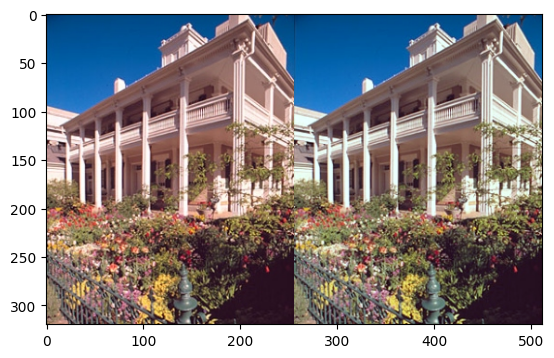

In [11]:
# load and convert the image to rgb
image = cv2.imread('images/beehive_house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

image_gw = apply_grey_world_algorithm(image)

images = np.hstack((image, image_gw))
plt.imshow(images)
plt.show()

<a id="question-7"></a>
#### <font color='#FF0000'>Question 7 (2 points)</font>

Give an example case for Grey-World Algorithm on where it might fail. Include your reasoning.

##### <font color='yellow'>Answer:</font>

> An example where the gray-world algorithm might fail is in the case where the average of the image is not (supposed to be) gray. An image of a forest, for example, might include a lot of green that is supposed to be green. Here the gray-world algorithm might overcompensate for the high amount green in the image, reducing its realism.>*Write your answer here.*

<a id="question-8"></a>
#### <font color='#FF0000'>Question 8 (3 points)</font>

Find out one more colour constancy algorithm from the literature and explain it briefly.

##### <font color='yellow'>Answer:</font>

>The white patch retinex algorithm is a version if the retinex algorithm, where the idea is that there is a white patch in any image that is the brightest point of that image, and this point is (close to) white. This point is then considered the illuminant, and other colors in the picture are scaled according to this illuminant. This is implemented by obtaining the highest values for each color channel, and using those values as references for normalization, so that the highest values take the maximum possible value, and the rest gets scaled accordingly.>*Write your answer here.*

<a id="section-3"></a>
### **Section 3: Intrinsic Image Decomposition**

Intrinsic image decomposition is the process of separating an image into its formation components, such as reflectance (albedo) and shading (illumination). <a name="cite_ref-1"></a>[<sup>[1]</sup>](#cite_note-1) Then, under the assumptions of body (diffuse) reflection, linear sensor response and narrow band filters, the decomposition of the observed image $I(\vec{x})$ at position $\vec{x}$ can be approximated as the element-wise product of its albedo $R(\vec{x})$ and shading $S(\vec{x})$ intrinsics:

$$I(\vec{x})=R(\vec{x}) \times S(\vec{x})$$

In this part of the assignment, you will experiment with intrinsic image components to perform a particular computational photography application: material recolouring. For the experiments, we will use images from a synthetic intrinsic image dataset. <a name="cite_ref-2"></a>[<sup>[2]</sup>](#cite_note-2)

<a name="cite_note-1"></a><small>[1.](#cite_ref-1) H. G. Barrow and J. M. Tenenbaum. Recovering intrinsic scene characteristics from images. Computer Vision Systems, pages 3-26, 1978.</small>

<a name="cite_note-2"></a><small>[2.](#cite_ref-1) http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/


<a id="question-9"></a>
#### <font color='#FF0000'>Question 9 (2 points)</font>

In what other components can an image be decomposed other than albedo and shading? Give an example and explain the concepts in your answer.

##### <font color='yellow'>Answer:</font>

For Intrinsic Image Decomposition, the original image is represented by creating images that are based on the content of the original image, each representing different characteristics. <a name="cite_ref-1"></a>[<sup>[1]</sup>](#cite_note-1)

Components such as albedo and shading are the most commonly used to represent images this way, but other models can also include parameters such as <a name="cite_ref-2"></a>[<sup>[2]</sup>](#cite_note-2):

- Multiple interactions of light, such as the environment, ambient occlusion, color bleeding from interreflections, direct and different points of light, etc.
- Material reflectance components, such as specular reflections, translucency, scattering effects, etc.
- Geometry of the scene to better understand its three-dimensional structure and recreate spatial arrangements. This can be done by using elements such as the depth or the surface's normals. This is useful for applications that use AR/VR.
- Materials and textures used, to determine details such as the pattern of an object's surface, or whether they are lambertian, non-lambertian or heterogenous.

<a name="cite_note-1"></a><small>[1.](#cite_ref-1) Tappen, M.F. (2021). Image Decomposition: Traditional Approaches. In: Ikeuchi, K. (eds) Computer Vision. Springer, Cham. https://doi.org/10.1007/978-3-030-63416-2_549</small>

<a name="cite_note-2"></a><small>[2.](#cite_ref-2) Garces, E., Rodriguez-Pardo, C., Casas, D., Lopez-Moreno, J. (2021). A Survey on Intrinsic Images: Delving Deep Into Lambert and Beyond. Computer Vision and Pattern Recognition. https://doi.org/10.48550/arXiv.2112.03842</small>

<a id="question-10"></a>
#### <font color='#FF0000'>Question 10 (2 points)</font>

If you check the literature, you will see that almost all intrinsic image decomposition datasets are composed of synthetic images. What might be the reason for that?

##### <font color='yellow'>Answer:</font>

Intrinsic image decomposition datasets are often built using many synthetic images because obtaining accurate ground truth data from real-world scenes is extremely difficult. Creating them allows for complete control over the image's components, such as environment, lighting, materials, and geometry. This control eliminates the complexity and noise that can be found in real-world data. Additionally, synthetic data provides flexibility to create diverse scenarios and ensures consistency across experiments, which is challenging and costly with real-world data, and has proven to be a very good alternative.

<a id="question-11"></a>
#### <font color='#FF0000'>Question 11 (4 points)</font>

Choose an object with a single color from the `/intrinsic_images/` folder, which is based on the [synthetic intrinsic image dataset](http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/).

Demonstrate that you can reconstruct the original PNG image from its intrinsics using the albedo and shading. Your script should output a figure displaying the original image, its intrinsic images, and the reconstructed one. Complete the function `reconstruct_image_from_intrinsics()`.


In [12]:
def reconstruct_image_from_intrinsics(albedo_img, shading_img):
    """
    Reconstruct the original image from its intrinsic images (albedo and shading).

    This function takes the albedo and shading images as input, 
    and reconstructs the original image by multiplying albedo with shading.

    Args:
        albedo_img: Image representing the albedo (reflectance)
        shading_img: Image representing the shading

    Returns:
        iid_img: Reconstructed image
    """

    albedo_img = cv2.cvtColor(albedo_img, cv2.COLOR_BGR2RGB) / 255.0
    shading_img = cv2.cvtColor(shading_img, cv2.COLOR_BGR2RGB) / 255.0

    iid_img = albedo_img * shading_img

    return iid_img

object shape: (267, 480, 3)
object shading shape: (267, 480, 3)
object albedo shape: (267, 480, 3)


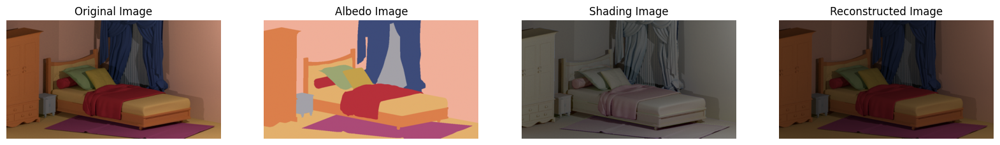

In [13]:
# Replace the object name with a valid name from the dataset
img_path = './intrinsic_images/'
object_name = 'bed1_w'

# Read with opencv
obj = cv2.imread(img_path + object_name + '.png')
if obj is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name + ".png"}')
else:
    print(f'object shape: {obj.shape}')

obj_sha = cv2.imread(img_path + object_name + '_shad.png')
if obj_sha is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name + "_shad.png"}')
else:
    print(f'object shading shape: {obj_sha.shape}')

obj_alb = cv2.imread(img_path + object_name.split('_')[0] + '_refl.png')
if obj_alb is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name.split("_")[0] + "_refl.png"}')
else:
    print(f'object albedo shape: {obj_alb.shape}')

obj_intrinsict = reconstruct_image_from_intrinsics(obj_alb, obj_sha)

figure, axs = plt.subplots(1, 4, figsize=(20, 5))
    
axs[0].imshow(cv2.cvtColor(obj, cv2.COLOR_BGR2RGB) / 255.0)
axs[0].set_title('Original Image')
axs[0].axis('off')

axs[1].imshow(cv2.cvtColor(obj_alb, cv2.COLOR_BGR2RGB) / 255.0)
axs[1].set_title('Albedo Image')
axs[1].axis('off')

axs[2].imshow(cv2.cvtColor(obj_sha, cv2.COLOR_BGR2RGB) / 255.0)
axs[2].set_title('Shading Image')
axs[2].axis('off')

axs[3].imshow(obj_intrinsict)
axs[3].set_title('Reconstructed Image')
axs[3].axis('off')

plt.show()

<a id="question-12"></a>
#### <font color='#FF0000'>Question 12 (2 points)</font>

Manipulating colors in photographs is an important problem with many applications in computer vision. Recoloring algorithms aim to manipulate colors effectively, and better results can be obtained if the albedo image is available as it is independent of confounding illumination effects.

First determine the true material color of the object you picked in RGB space (uniform color in this case). 

- Complete the code for the function `get_true_color()`.
- Plot the true color of the object in RGB space, make sure to also plot each channel separately. 

**Hint:** You can use `np.tile` to create a visualization of the true color.

In [14]:
def get_true_color(albedo_img):
    """
    Determines the true material color of the object in the albedo image.

    This function calculates the average RGB color in the albedo image, which represents the true material color of the object.

    Args:
        albedo_img: Albedo (reflectance) image

    Returns:
        true_colour: True material color of the object in RGB space
    """

    albedo = albedo_img / 255.0
    true_color = albedo.mean(axis=(0, 1))
    
    return true_color

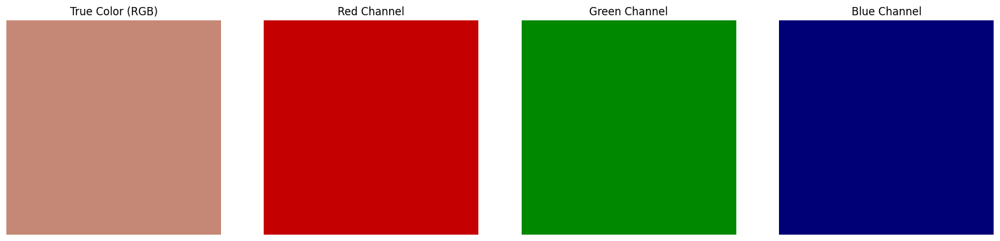

In [15]:
# get the true color of the object's albedo image
obj_alb_rgb = cv2.cvtColor(obj_alb, cv2.COLOR_BGR2RGB)
true_color = get_true_color(obj_alb_rgb)

true_color_array = np.tile(true_color, (50, 50, 1))

figure, axs = plt.subplots(1, 4, figsize=(20, 5))

axs[0].imshow(true_color_array)
axs[0].set_title('True Color (RGB)')
axs[0].axis('off')

red_channel = np.zeros_like(true_color_array)
red_channel[..., 0] = true_color[0]
axs[1].imshow(red_channel)
axs[1].set_title('Red Channel')
axs[1].axis('off')

green_channel = np.zeros_like(true_color_array)
green_channel[..., 1] = true_color[1]
axs[2].imshow(green_channel)
axs[2].set_title('Green Channel')
axs[2].axis('off')

blue_channel = np.zeros_like(true_color_array)
blue_channel[..., 2] = true_color[2]
axs[3].imshow(blue_channel)
axs[3].set_title('Blue Channel')
axs[3].axis('off')

plt.show()

<a id="question-13"></a>
#### <font color='#FF0000'>Question 13 (2 points)</font>

Assume you are given the PNG image and have access to its intrinsic albedo and shading images.

Recolor the object's image with pure red (255, 0, 0). Complete the code for the function `recolor_image()`. Display the recolored version of the object. Make sure to also plot each channel separately.

In [16]:
def recolor_image(albedo_img, shading_img):
    """
    Recolors an image based on its albedo and shading images.

    This function recolors the input albedo image by changing non-black pixels to red
    and then reconstructs the final image using the provided shading image.

    Args:
        albedo_img: Albedo (reflectance) image
        shading_img: Shading image

    Returns:
        recolored_img: Recolored and reconstructed image
    """

    albedo_img = cv2.cvtColor(albedo_img, cv2.COLOR_BGR2RGB) / 255.0
    shading_img = cv2.cvtColor(shading_img, cv2.COLOR_BGR2RGB) / 255.0

    red_channel_filter = np.zeros_like(albedo_img)
    red_channel_filter[..., 0] = 1

    recolored_albedo_img = red_channel_filter * albedo_img
    recolored_albedo_img = (recolored_albedo_img > 0).astype(float)

    recontructed_img = recolored_albedo_img * shading_img

    return recontructed_img

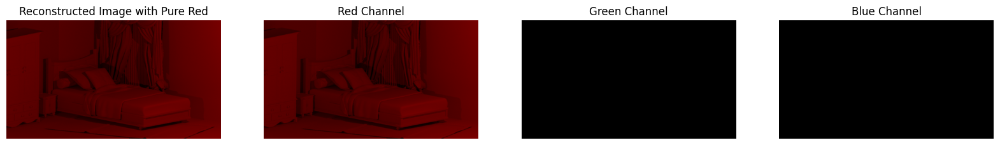

In [17]:
recolored_image = recolor_image(obj_alb, obj_sha)

figure, axs = plt.subplots(1, 4, figsize=(20, 5))

axs[0].imshow(recolored_image)
axs[0].set_title('Reconstructed Image with Pure Red')
axs[0].axis('off')

red_channel = np.zeros_like(recolored_image)
red_channel[..., 0] = recolored_image[..., 0]
axs[1].imshow(red_channel)
axs[1].set_title('Red Channel')
axs[1].axis('off')

green_channel = np.zeros_like(recolored_image)
green_channel[..., 1] = recolored_image[..., 1]
axs[2].imshow(green_channel)
axs[2].set_title('Green Channel')
axs[2].axis('off')

blue_channel = np.zeros_like(recolored_image)
blue_channel[..., 2] = recolored_image[..., 2]
axs[3].imshow(blue_channel)
axs[3].set_title('Blue Channel')
axs[3].axis('off')

plt.show()

<a id="question-14"></a>
#### <font color='#FF0000'>Question 14 (2 points)</font>

Although you have recoloured the object with pure red, the reconstructed images do not seem to display those pure colors and thus the colour distributions over the object do not appear uniform. Explain the reason.

##### <font color='yellow'>Answer:</font>

The reconstructed image does not show the same pure red color used on the albedo image because it also uses the shading image to create the final image. The shading image affects the way in which light interacts with each surface, so it can change the intensity and brightness of the colors from the albedo image. 

__Note:__  This was a simple case where the image is synthetic, object centered and has only one colour, and you have access to its ground-truth intrinsic images. Real world scenarios require more than just replacing a single colour with another, not to mention the complexity of achieving a decent intrinsic image decomposition.

<a id="section-4"></a>
### **Section 4: Photometric Stereo**

In this section, we delve into the photometric stereo technique, a method used to reconstruct a surface's shape from a set of images captured under varying lighting conditions. This approach is based on the principles outlined in Section 5.4 of Forsyth and Ponce's *Computer Vision: A Modern Approach*, which provides a comprehensive introduction to the theory and application of photometric stereo in computer vision.

Photometric stereo is particularly useful for capturing fine details of surface geometry. The core idea is to utilize an orthographic camera to take multiple images of a surface, each under different lighting conditions. By analyzing the variations in image intensity across these images, we can infer the surface normals and, subsequently, reconstruct the surface's height at each pixel, leading to what is commonly known as a height map or depth map.

The method assumes that the camera and the surface remain stationary, with illumination coming from different directions. By capturing enough images with different light source vectors, we can solve for the surface normals and albedo at each pixel.

<a id="question-15"></a>
#### <font color='#FF0000'>Question 15 (4 points)</font>

Start with the grayscale sphere model located in the SphereGray5 folder. The folder contains 5 images of a sphere with a grayscale checker texture under different lighting conditions. Your task is to estimate the surface reflectance (albedo) and surface normal of this model.

In this question, you will need to complete the function `estimate_albedo_and_normals()` to estimate the albedo and surface normal map for the SphereGray5 folder.

To assist you, two helper functions are provided:

- `load_synthetic_images()`: This function loads the synthetic images from the specified directory.
- `show_results()`: This function displays the albedo, surface normals, and optionally the height map and surface error.

These helper functions are provided to simplify the process of loading images and displaying your results.

**Hint**: To get the least-squares solution of a linear system, you can use the `numpy.linalg.lstsq` function.

Make sure to include images of your results in your notebook at key points. When visualizing 3D models, choose viewpoints that clearly illustrate the structure, and feel free to use multiple viewpoints if necessary.

In [18]:
def load_synthetic_images(image_dir='./images/photometrics_images/SphereGray5/', channel=0):
    """
    Loads synthetic images and their corresponding light source directions.

    This function reads all images from the specified directory, extracts the relevant channel, and stacks the images along the third dimension. It also extracts the light source directions from the image filenames and normalizes both the image stack and the light source vectors.

    Args:
        image_dir: directory containing the synthetic images
        channel: color channel to be extracted (default is 0, corresponding to the red channel)

    Returns:
        image_stack: a 3d numpy array of stacked images
        normalized_light_dirs: a 2d numpy array of normalized light source directions
    """
    # list all files in the image directory
    image_files = os.listdir(image_dir)
    num_images = len(image_files)

    image_stack = None
    light_directions = None
    
    # assumed z component for the light direction
    z_component = 0.5  

    # loop through all image files
    for i in range(num_images):
        # read the input image
        image = cv2.imread(os.path.join(image_dir, image_files[i]))
        image = np.flip(image, axis=-1)  # flip the image to correct the channel order
        image = image[:, :, channel]  # extract the specified color channel

        # initialize image stack and light direction array on the first iteration
        if image_stack is None:
            height, width = image.shape
            print('image size (h*w): %d*%d' % (height, width))
            image_stack = np.zeros([height, width, num_images], dtype=int)
            light_directions = np.zeros([num_images, 3], dtype=np.float64)

        # stack the image along the third dimension
        image_stack[:, :, i] = image

        # extract light direction from the image filename
        x_component = np.double(image_files[i][(image_files[i].find('_') + 1):image_files[i].rfind('_')])
        y_component = np.double(image_files[i][image_files[i].rfind('_') + 1:image_files[i].rfind('.png')])
        light_directions[i, :] = [x_component, -y_component, z_component]

    # convert the image stack to double precision for further processing
    image_stack = np.double(image_stack)

    # normalize the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)

    # handle the case where all pixel values are the same
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  

    # normalize the light direction vectors
    norm_factors = np.tile(np.sqrt(np.sum(light_directions ** 2, axis=1, keepdims=True)), (1, light_directions.shape[1]))
    normalized_light_dirs = light_directions / norm_factors

    return image_stack, normalized_light_dirs

In [19]:
def show_results(albedo, normals, height_map=None, SE=None):
    """
    Displays the albedo, normals, and optionally the height map and surface error (SE).

    Args:
        albedo: albedo (reflectance) map
        normals: surface normal map
        height_map: reconstructed height map (optional)
        SE: surface error map (optional)
    """
    # stride in the plot, you may want to adjust it to different images
    stride = 1

    if albedo is not None:
        # showing albedo map
        fig = plt.figure(figsize=(5, 5))
        albedo_max = 1  # normalize albedo values
        albedo = albedo / albedo_max
        print("Albedo shape:", albedo.shape)
        plt.imshow(albedo, cmap="gray")
        plt.title('Albedo Map', fontsize=16)
        plt.show()

    # showing normals as three separate channels
    figure = plt.figure(figsize=(10, 10))
    ax1 = figure.add_subplot(221)
    ax1.imshow(normals[..., 0], vmin=-1, vmax=1, cmap='viridis')
    ax1.set_axis_off()
    ax1.set_title('Normal Channel x', fontsize=16)
    ax2 = figure.add_subplot(222)
    ax2.imshow(normals[..., 1], vmin=-1, vmax=1, cmap='viridis')
    ax2.set_axis_off()
    ax2.set_title('Normal Channel y', fontsize=16)
    ax3 = figure.add_subplot(223)
    ax3.imshow(normals[..., 2], vmin=-1, vmax=1, cmap='viridis')
    ax3.set_axis_off()
    ax3.set_title('Normal Channel z', fontsize=16)
    ax4 = figure.add_subplot(224)
    ax4.imshow((normals + 1) * 0.5)
    ax4.set_axis_off()
    ax4.set_title('Combined Normals', fontsize=16)
    plt.show()

    # Create meshgrid for plotting 3D surfaces
    X, Y, _ = np.meshgrid(np.arange(0, np.shape(normals)[0], stride),
                          np.arange(0, np.shape(normals)[1], stride),
                          np.arange(1))
    X = X[..., 0]
    Y = Y[..., 0]

    # Show both heightmap and SE in a 1x2 subplot if they're available
    if height_map is not None and SE is not None:
        fig = plt.figure(figsize=(8, 4))

        # Show heightmap
        ax1 = fig.add_subplot(1, 2, 1, projection='3d')
        H_height_map = height_map[::stride, ::stride]
        ax1.plot_surface(X, Y, H_height_map.T)
        ax1.set_title("Height Map")

        # Show SE
        ax2 = fig.add_subplot(1, 2, 2, projection='3d')
        H_SE = SE[::stride, ::stride]
        ax2.plot_surface(X, Y, H_SE.T, color='r')
        ax2.set_title("SE")

        plt.tight_layout()
        plt.show()

    # Only show heightmap if it's available
    elif height_map is not None:
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')
        H_height_map = height_map[::stride, ::stride]
        ax.plot_surface(X, Y, H_height_map.T)
        ax.set_title("Height Map")
        plt.show()

    # Only show SE if it's available
    elif SE is not None:
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')
        H_SE = SE[::stride, ::stride]
        ax.plot_surface(X, Y, H_SE.T, color='r')
        ax.set_title("SE")
        plt.show()

    if albedo is not None:
        # Quiver plot to show normal directions
        fig, ax = plt.subplots(figsize=(5, 5))
        print("Albedo shape:", albedo.shape)
        ax.imshow(albedo, cmap="gray")
        ax.set_title('Normal Directions (Quiver Plot)', fontsize=16)
    
        # Subsample the normals to avoid cluttering
        X_quiv = X[::10, ::10]
        Y_quiv = Y[::10, ::10]
        U = normals[::10, ::10, 0]  # x-component of normals
        V = normals[::10, ::10, 1]  # y-component of normals
        
        # Plot quiver
        ax.quiver(Y_quiv, X_quiv, U, V, color='red', scale=1, scale_units='xy')
    
        plt.show()

Following the guidelines in *Computer Vision: A Modern Approach* by Forsyth and Ponce, Chapter 5, Section 5.4, you will complete the `estimate_albedo_and_normals()` function by implementing the following steps:

1. **Iterate through each point in the image array**:
   - For each pixel, extract the intensity values across all images and stack them into a vector `i`.

2. **Construct the diagonal matrix**:
   - Construct the diagonal matrix `scriptI` using the vector `i`.

3. **Solve the linear system**:
   - Solve the equation `scriptI * scriptV * g = scriptI * i` to obtain the vector `g` for each pixel.

4. **Compute the albedo**:
   - The albedo at each pixel is the magnitude (norm) of the vector `g`, denoted as `|g|`.

5. **Compute the surface normal**:
   - The surface normal at each pixel is given by `g / |g|`, where `|g|` is non-zero.

In [20]:
def estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=True):
    """
    Estimates the surface albedo and normals from a stack of images.

    This function computes the albedo and surface normals for each pixel in the 
    image stack using the provided light source directions. Optionally, it applies 
    the shadow trick to improve the robustness of the solution.

    Args:
        image_stack: The stack of images of the surface, stacked along the third dimension.
        scriptV: The matrix containing the source and camera information.
        shadow_trick: Boolean indicating whether to use the shadow trick (default is True).

    Returns:
        albedo: The estimated surface albedo.
        normal: The estimated surface normals.
    """

    h, w, _ = image_stack.shape

    # create arrays for the albedo and normals
    albedo = np.zeros([h, w])
    normal = np.zeros([h, w, 3])
    
    for p in range(h):
        for q in range(w):
            # get the pixel value for all images at the current pixel location
            i = image_stack[p, q, :]
            scriptI = np.diag(i)
            if shadow_trick:
                g,_,_,_ = np.linalg.lstsq((scriptI @ scriptV), (scriptI @ i), rcond=None)
            else:
                g,_,_,_ = np.linalg.lstsq(scriptV, i, rcond=None)
            albedo[p,q] = np.linalg.norm(g)
            if albedo[p,q] != 0:
                normal[p,q] = 0
                normal[p,q] = g / albedo[p,q]
            else:
                normal[p,q] = 0

    return albedo, normal

image size (h*w): 512*512
Results SphereGray5 with shadow trick
Albedo shape: (512, 512)


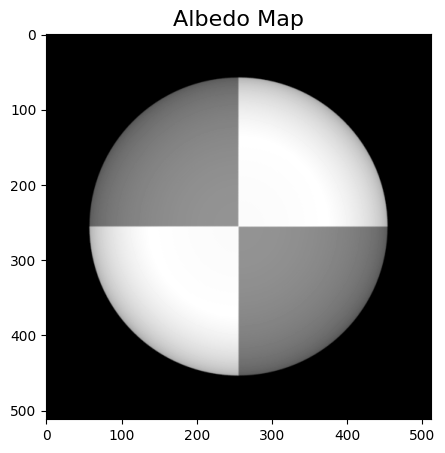

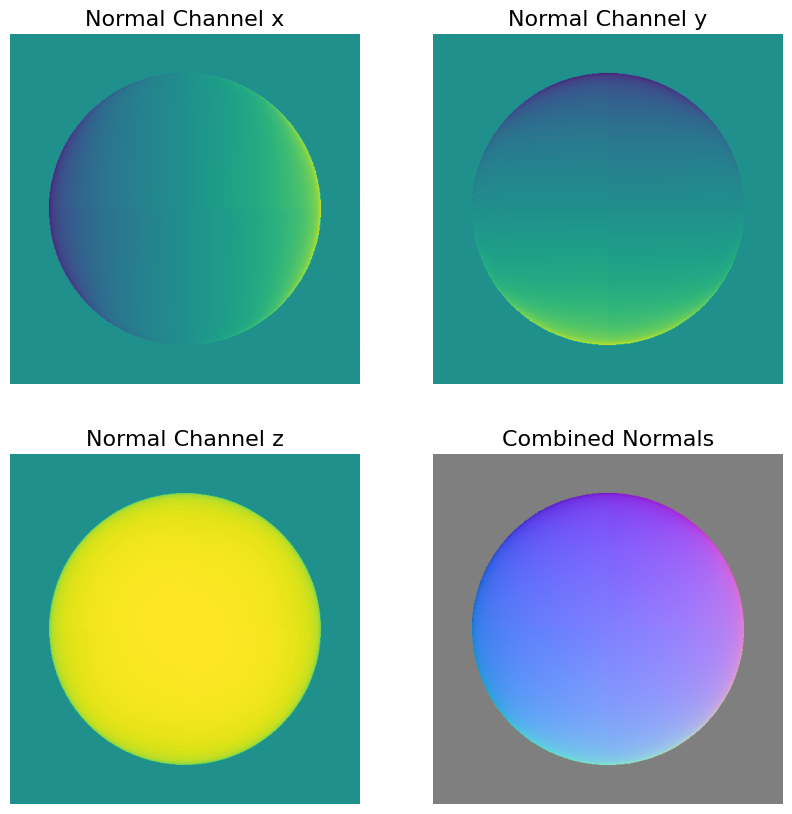

Albedo shape: (512, 512)


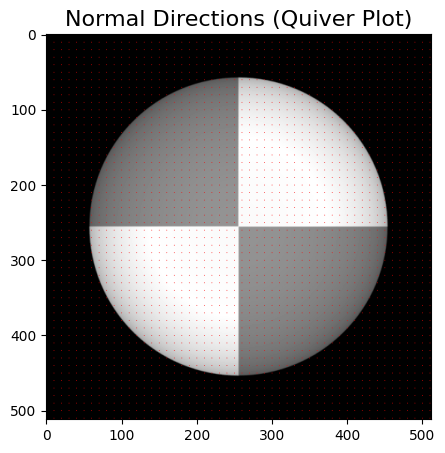

In [21]:
# load synthetic images for SphereGray5
image_stack_5, normalized_light_dirs_5 = load_synthetic_images('./photometrics_images/SphereGray5/')

# estimate albedo and normals with shadow trick
albedo_5_trick, normals_5_trick = estimate_albedo_and_normals(image_stack_5, normalized_light_dirs_5, True)

# show results with shadow trick
print("Results SphereGray5 with shadow trick")
show_results(albedo_5_trick, normals_5_trick, height_map=None, SE=None)

<a id="question-16"></a>
#### <font color='#FF0000'>Question 16 (2 points)</font>

After implementing the `estimate_albedo_and_normals()` function, what do you expect to see in the albedo image? How does this compare to your actual result? Explain the differences.

##### <font color='yellow'>Answer:</font>

In the third lecture, albedo is introduced as the fraction of incoming light that is reflected. Therefore, the surface of the sphere in the albedo image should represent the relative reflection of the light. I would expect the surroundings to be a bit darker due to the shadows in the images, but that is not the case as the shadow trick is used. Furthermore, once we have obtained the albedo, we can compute the three normals. By combining these three normals I expect to see a reconstruction of the shape of the sphere, which is indeed the case.

<a id="question-17"></a>
#### <font color='#FF0000'>Question 17 (1 point)</font>

In principle, what is the minimum number of images you need to estimate the albedo and surface normal? Explain your reasoning.

##### <font color='yellow'>Answer:</font>

The minimum number of images needed is at least three as three components are needed to represent the image in a 3D setting.

<a id="question-18"></a>
#### <font color='#FF0000'>Question 18 (2 points)</font>

Now, run the algorithm with more images by using the SphereGray25 folder. Observe the differences in the results when using more images. Report your findings. 

You could try all images at once or a few at a time, incrementally. Choose a strategy and justify it by discussing your results.

image size (h*w): 512*512
Results SphereGray25 with shadow trick
Albedo shape: (512, 512)


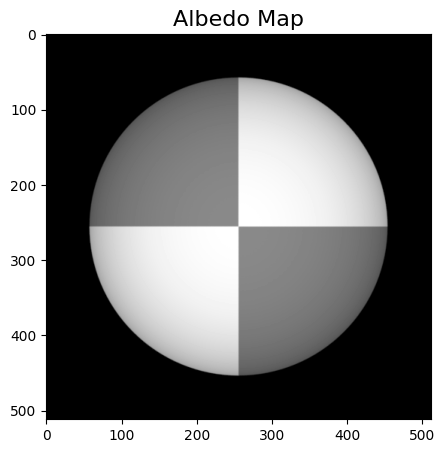

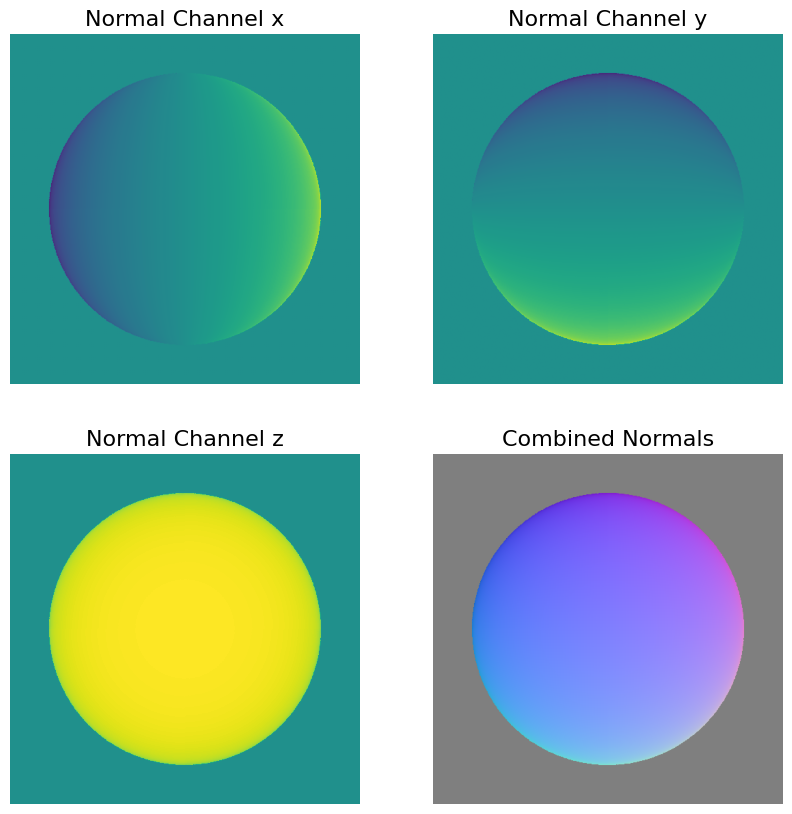

Albedo shape: (512, 512)


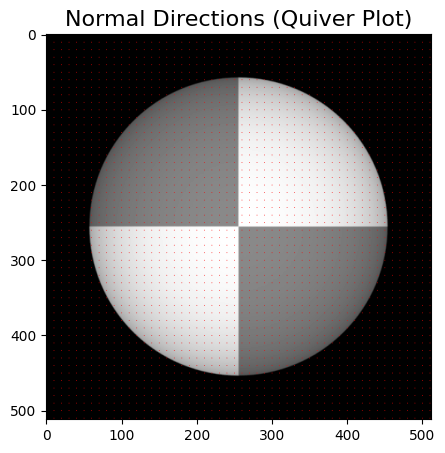

In [22]:
# load synthetic images for SphereGray25
image_stack_25, normalized_light_dirs_25 = load_synthetic_images("./photometrics_images/SphereGray25/")

# estimate albedo and normals with shadow trick
albedo_25_trick, normals_25_trick = estimate_albedo_and_normals(image_stack_25, normalized_light_dirs_25, True)

# show results with shadow trick
print("Results SphereGray25 with shadow trick")
show_results(albedo_25_trick, normals_25_trick, height_map=None, SE=None)

##### <font color='yellow'>Answer:</font>

We have ran the algorithm for 5 & 25 images and there is almost no differences in both the albedo map and the combined normals. So, using the shadow trick, the 5 images seem to be enough to reconstruct the surface shape of the sphere.

<a id="question-19"></a>
#### <font color='#FF0000'>Question 19 (2 points)</font>

Consider the impact of shadows in photometric stereo. Explain the trick mentioned in the textbook to deal with shadows.

Remove this trick from your implementation and check your results. Is the trick necessary when using 5 images? How about when using 25 images?

image size (h*w): 512*512
Results SphereGray5 without shadow trick
Albedo shape: (512, 512)


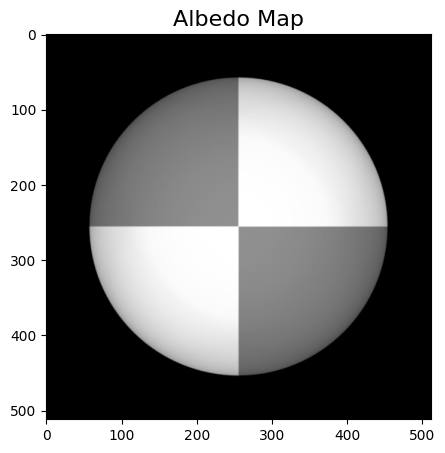

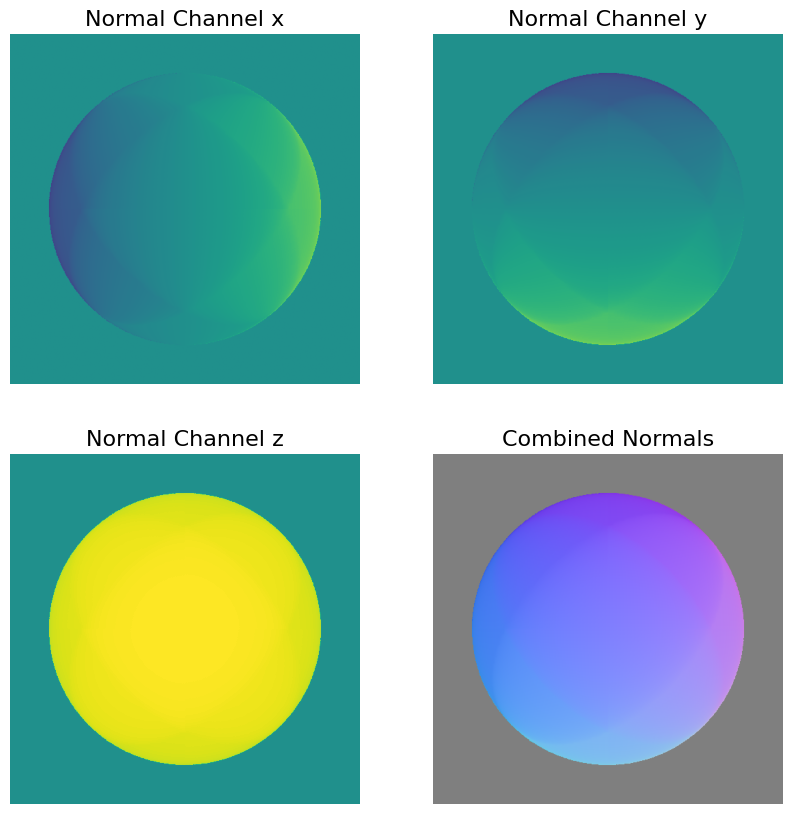

Albedo shape: (512, 512)


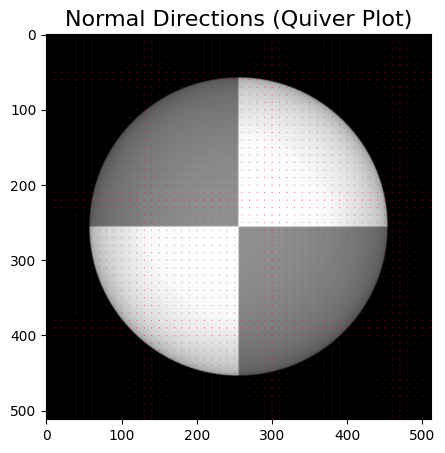

Results SphereGray25 without shadow trick
Albedo shape: (512, 512)


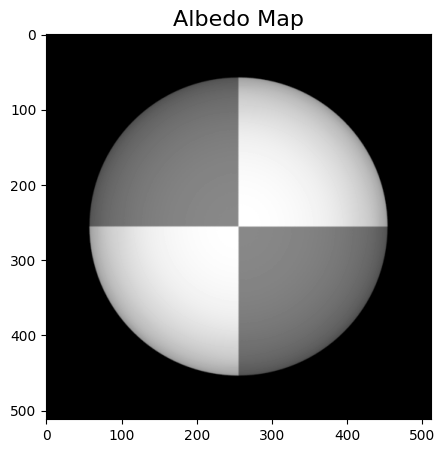

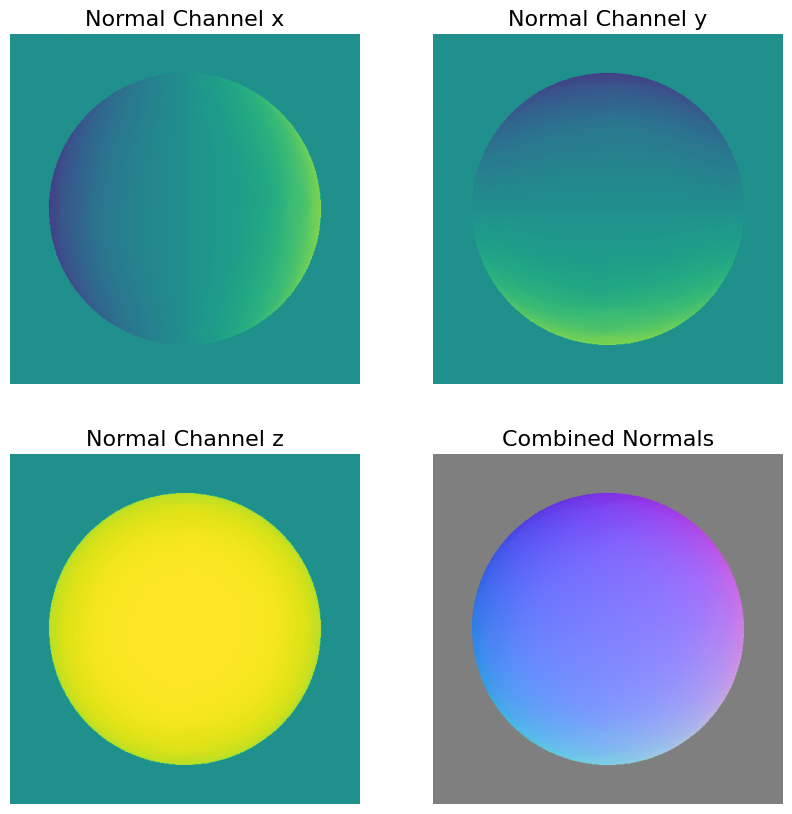

Albedo shape: (512, 512)


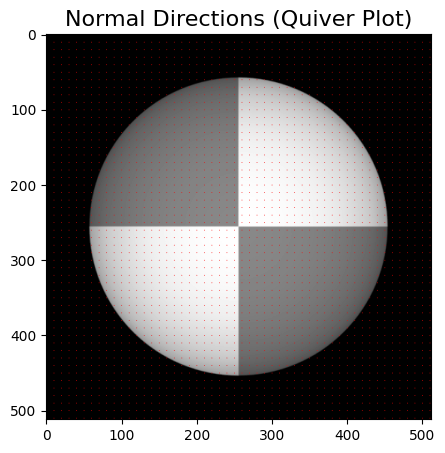

In [23]:
# load synthetic images for SphereGray5 and SphereGray25
image_stack_25, normalized_light_dirs_25 = load_synthetic_images("./photometrics_images/SphereGray25/")

# estimate albedo and normals without shadow trick
albedo_5, normals_5 = estimate_albedo_and_normals(image_stack_5, normalized_light_dirs_5, False)
albedo_25, normals_25 = estimate_albedo_and_normals(image_stack_25, normalized_light_dirs_25, False)

# show results without shadow trick
print("Results SphereGray5 without shadow trick")
show_results(albedo_5, normals_5, height_map=None, SE=None)

print("Results SphereGray25 without shadow trick")
show_results(albedo_25, normals_25, height_map=None, SE=None)

##### <font color='yellow'>Answer:</font>

As can be seen in the figures earlier, there is a difference between the combined normals with and without trick for 5 images. The combined normal without trick for 5 images suggests a wrong shape for the sphere. For 25 images on the other hand, the combined normals with and without trick look the same. This seems to suggest that the shadow trick is only necessary for a couple (like 5) images, but not when the number of images increases (like 25). The shadow trick creates a diagonal matrix out of the vector i, which contains the intenstiy values across all images. By performing the following matrix multiplication, diag(i)@i, the zeros in the diagonal matrix eliminate the shadow contributions as mentioned in the given chapter 5.4.

<a id="question-20"></a>
#### <font color='#FF0000'>Question 20 (5 points)</font>

Before reconstructing the surface height map, it is necessary to compute the partial derivatives, $\frac{\partial f}{\partial x}$ and $\frac{\partial f}{\partial y}$ (referred to as *p* and *q* in the algorithm). These partial derivatives also allow for a double-check of the computation through a test of *integrability*.

In this question, you will need to complete the function `check_integrability()` to compute the partial derivatives *p* and *q*.

Make sure to verify your results by examining the integrability of the computed derivatives.

In [24]:
def check_integrability(normals):
    """
    Checks the surface gradient for integrability.

    This function computes the partial derivatives of the surface function with respect to x and y 
    (p and q), and calculates the squared errors of the mixed partial derivatives to test for integrability.

    Args:
        normals: The normal map of the surface.

    Returns:
        p: The partial derivative of the surface function with respect to x (df/dx).
        q: The partial derivative of the surface function with respect to y (df/dy).
        SE: The squared errors of the mixed partial derivatives.
    """

    # Initialize p, q, and SE
    p = np.zeros(normals.shape[:2])
    q = np.zeros(normals.shape[:2])
    SE = np.zeros(normals.shape[:2])    

    # Compute the partial derivates (p and q)
    p = normals[:,:,0] / normals[:,:,2]
    q = normals[:,:,1] / normals[:,:,2]
    
    # Set NaN values to zero
    p = np.nan_to_num(p)
    q = np.nan_to_num(q)
    
    # Compute the second derivatives (dp and dq)
    dp = np.gradient(p, axis=0)  
    dq = np.gradient(q, axis=1)  

    # Compute the squared errors (SE) of the mixed partial derivatives
    SE = (dp - dq) ** 2

    return -p, -q, SE

In [25]:
# Use the normals that you found in the previous question
p_5, q_5, SE_5 = check_integrability(normals_5)

print('Showing the integrability check results for 5 light sources obtained in the previous question:')
print(f'SE max: {SE_5.max()}\n')

p_25, q_25, SE_25 = check_integrability(normals_25)

print('Showing the integrability check results for 25 light sources obtained in the previous question:')
print(f'SE max: {SE_25.max()}')

Showing the integrability check results for 5 light sources obtained in the previous question:
SE max: 0.29038929411821185

Showing the integrability check results for 25 light sources obtained in the previous question:
SE max: 0.2429039907368924


<a id="question-21"></a>
#### <font color='#FF0000'>Question 21 (3 points)</font>

Implement and compute the partial derivatives according to the provided algorithm, and perform the test of integrability by applying a reasonable threshold to the squared errors. 

Reflect on the potential causes of any errors observed. Additionally, analyze how the test of integrability performs when using the GraySphere5 and GraySphere25 datasets. Use the normal maps obtained from the previous steps with the shadow trick applied.

Showing the integrability check results for 5 light sources with the shadow trick applied:
SE max: 1.1575454400510214

Showing the integrability check results for 25 light sources with the shaodow trick applied:
SE max: 0.8672454889034569
Results SphereGray5 with shadow trick with filtered SE
Albedo shape: (512, 512)


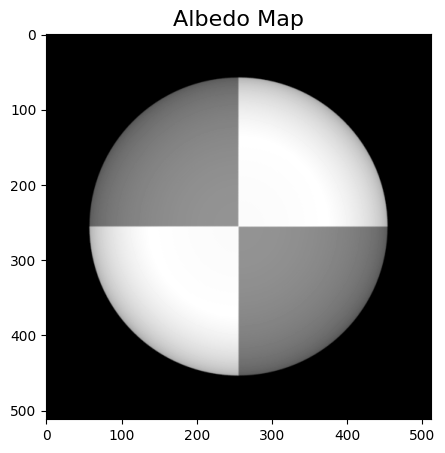

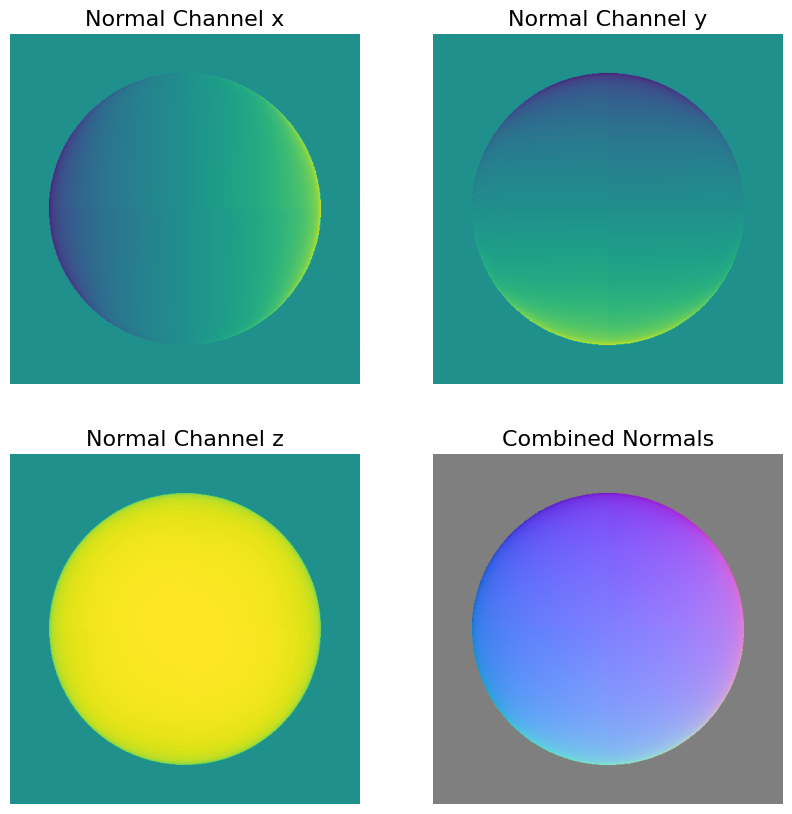

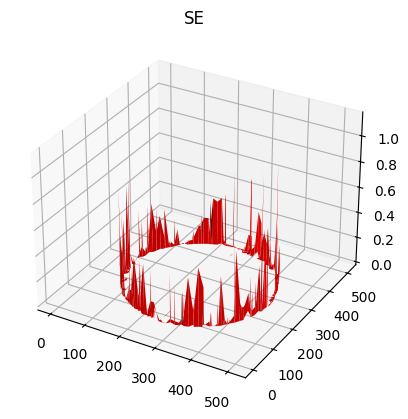

Albedo shape: (512, 512)


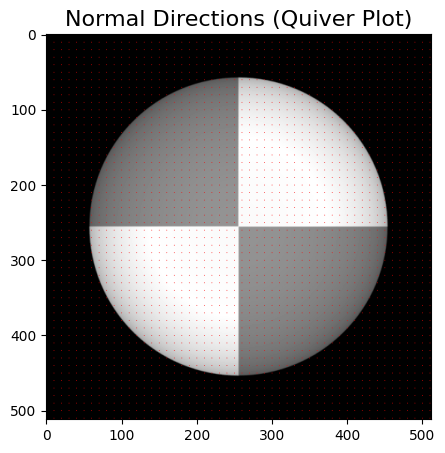

Results SphereGray25 with shadow trick with filtered SE
Albedo shape: (512, 512)


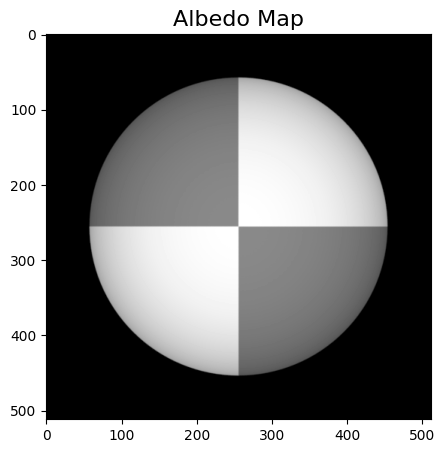

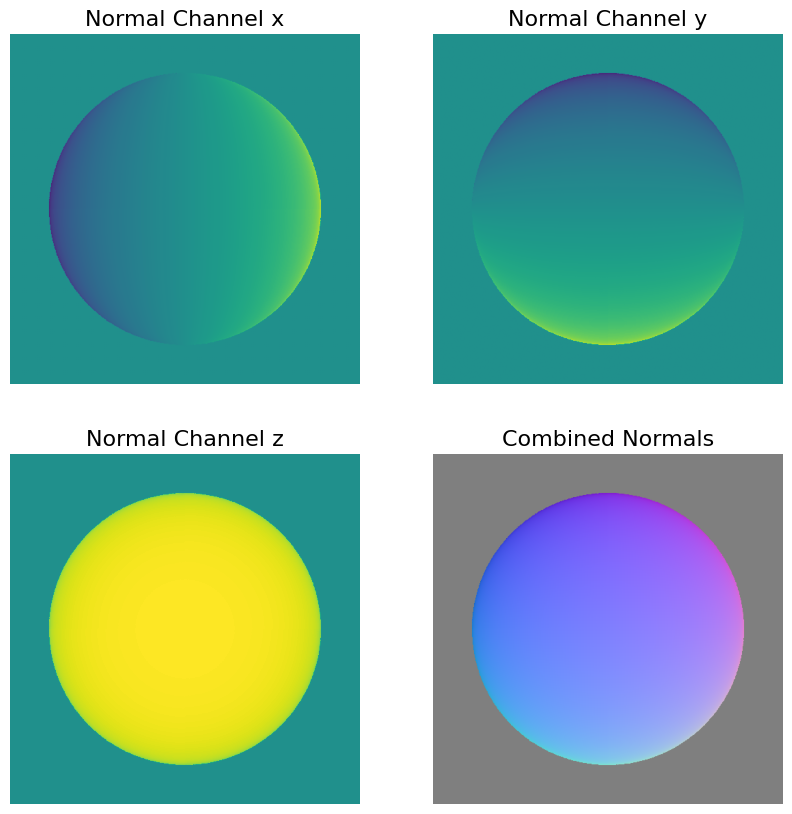

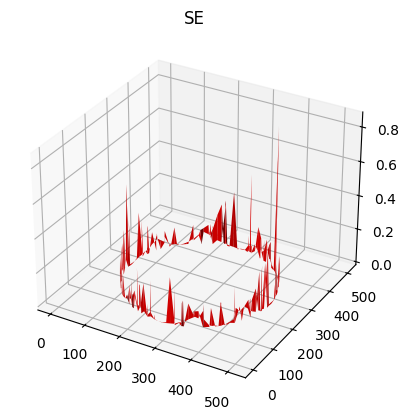

Albedo shape: (512, 512)


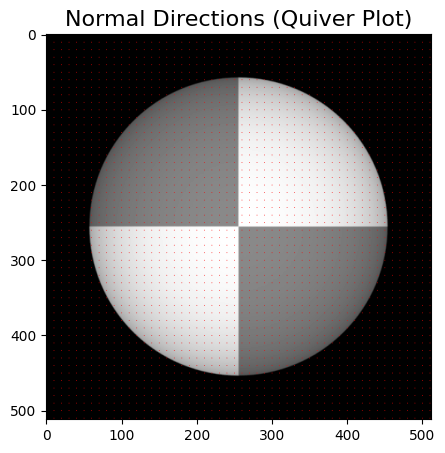

In [26]:
# Use the normals that you found in the previous steps with the shadow trick
p_5_trick, q_5_trick, SE_5_trick = check_integrability(normals_5_trick)

print('Showing the integrability check results for 5 light sources with the shadow trick applied:')
print(f'SE max: {SE_5_trick.max()}\n')

p_25_trick, q_25_trick, SE_25_trick = check_integrability(normals_25_trick)

print('Showing the integrability check results for 25 light sources with the shaodow trick applied:')
print(f'SE max: {SE_25_trick.max()}')

# set threshold
threshold = 1e-4 

# 5 light sources
print("Results SphereGray5 with shadow trick with filtered SE")
filtred_SE_5_trick= np.where(SE_5_trick > threshold, SE_5_trick, np.nan)
show_results(albedo_5_trick, normals_5_trick, height_map=None, SE=filtred_SE_5_trick)

# 25 light sources
print("Results SphereGray25 with shadow trick with filtered SE")
filtred_SE_25_trick= np.where(SE_25_trick > threshold, SE_25_trick, np.nan)
show_results(albedo_25_trick, normals_25_trick, height_map=None, SE=filtred_SE_25_trick)

##### <font color='yellow'>Answer:</font>

We used a threshold of 0.0001 as lower values give points in the middle, which is not desirable. We notice for both SE plots some errors that are higher than zero. This may be due to image noise where random variation in the pixel may cause the gradient to change instead of actual changes in the picture. Furthermore, a low resolution could also be the cause. Low resolution means that there are less pixels such that each pixel contains a larger area, which may lead to the gradient (over the larger area) being less precise. Furthermore, we notice in the SE figures and the maximum SE values that using more lightsources decreases the SE.

<a id="question-22"></a>
#### <font color='#FF0000'>Question 22 (6 points)</font>

To reconstruct the surface height map, you need to integrate the partial derivatives over a path. Since we are working with discrete structures, this integration is done by summing their values.

The algorithm presented in the chapter suggests performing the integration in a column-major order: start at the top-left corner, integrate along the first column, and then proceed to the right along each row. However, it is also recommended to use multiple paths and average the results to help distribute the errors from derivative estimates.

In this question, you will:

1. Construct the surface height map using column-major order as described in the algorithm.
2. Implement the row-major path integration method.

Your implementation should be added to the `construct_surface()` function.

**Note**: By default, Numpy uses row-major operations. If you unroll an image to linearize the operation, you will end up with a row-major representation. Numpy can be configured to use column-major order, but this concern does not apply if you are using double for-loops without unrolling.

**Hint**: To further inspect the shape of the objects and normal directions, consider using the `matplotlib.pyplot.quiver` function. Be sure to choose appropriate sub-sampling ratios for proper illustration. Add this to the `show_results()` function if needed.

In [27]:
def construct_surface(p, q, path_type='column'):
    """
    Constructs the surface function represented as height_map.

    This function integrates the partial derivatives p and q to reconstruct the surface height map.
    The integration can be done along a column-major, row-major, or an averaged path.

    Args:
        p: The partial derivative of the surface function with respect to x (df/dx).
        q: The partial derivative of the surface function with respect to y (df/dy).
        path_type: The type of path to construct the height_map, either 'column', 'row', or 'average'.

    Returns:
        height_map: The reconstructed surface height map.
    """

    h, w = p.shape
    height_map = np.zeros([h, w])

    # Column-major path integration
    if path_type == 'column':
        for i in range(1, h):
            height_map[i, 0] = height_map[i - 1, 0] + q[i, 0]

        for i in range(h):
            for j in range(1, w):
                height_map[i, j] = height_map[i, j - 1] + p[i, j]

    # Row-major path integration
    elif path_type == 'row':
        for j in range(1, w):
            height_map[0, j] = height_map[0, j - 1] + p[0, j]

        for j in range(w):
            for i in range(1, h):
                height_map[i, j] = height_map[i - 1, j] + q[i, j]

    elif path_type == 'average':
        # Average of column-major and row-major integration
        height_map_column = construct_surface(p, q, path_type='column')
        height_map_row = construct_surface(p, q, path_type='row')
        height_map = (height_map_column + height_map_row) / 2.0

    return height_map

Showing the surface reconstruction results for 5 light sources using column-major integration:


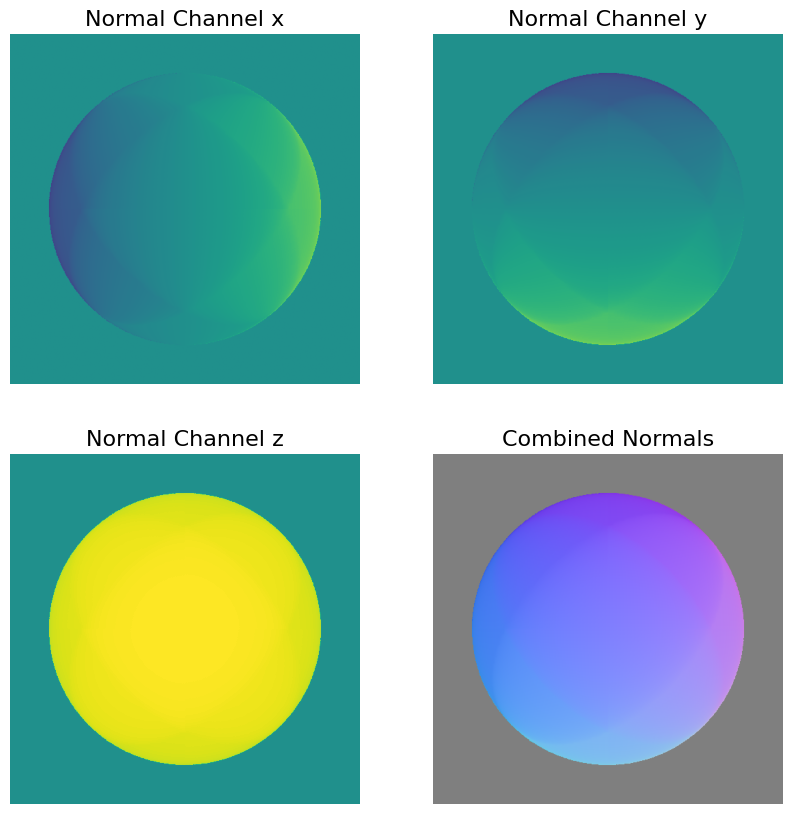

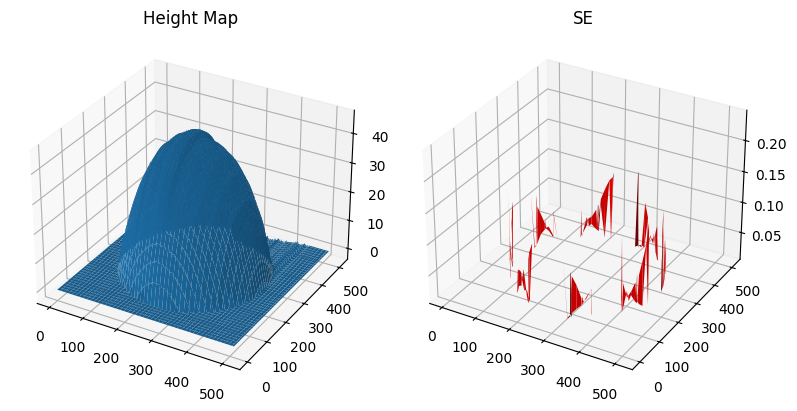

In [28]:
p, q, SE = check_integrability(normals_25)

height_map = construct_surface(p, q, "column")

# set the threshold for visualization
threshold = 0.01
SE[SE <= threshold] = float('nan')

print('Showing the surface reconstruction results for 5 light sources using column-major integration:')
show_results(None, normals_5, height_map, SE)

<a id="question-23"></a>
#### <font color='#FF0000'>Question 23 (2 points)</font>

Compare the results obtained from the two different integration paths (column-major and row-major). 

What are the differences in the reconstructed surface height maps when using these two paths? Discuss any observations you notice between the two approaches.

Showing the surface reconstruction results for 5 light sources using row-major integration:


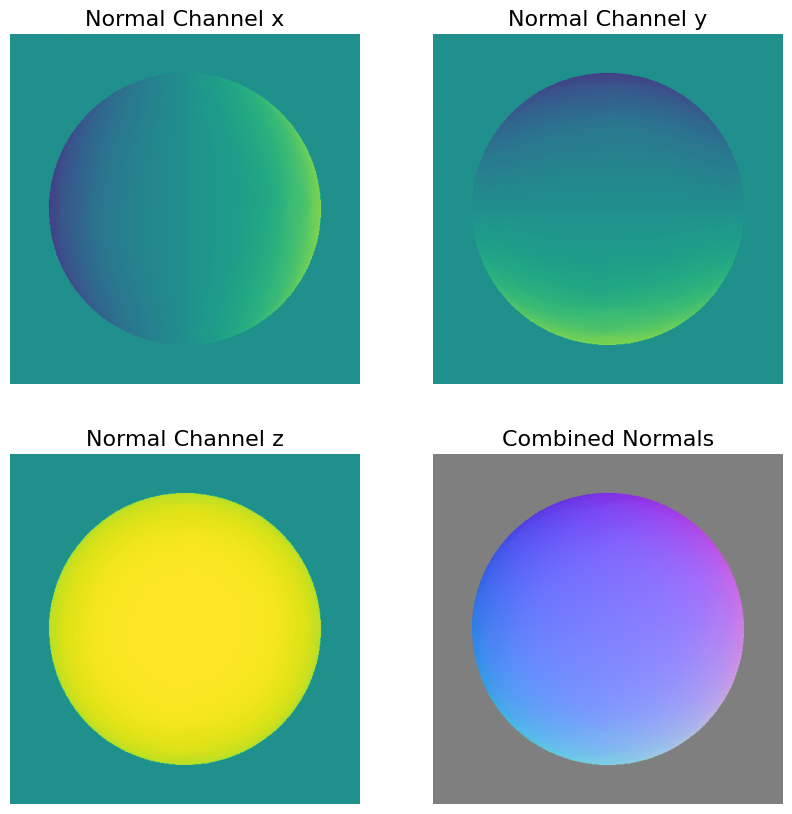

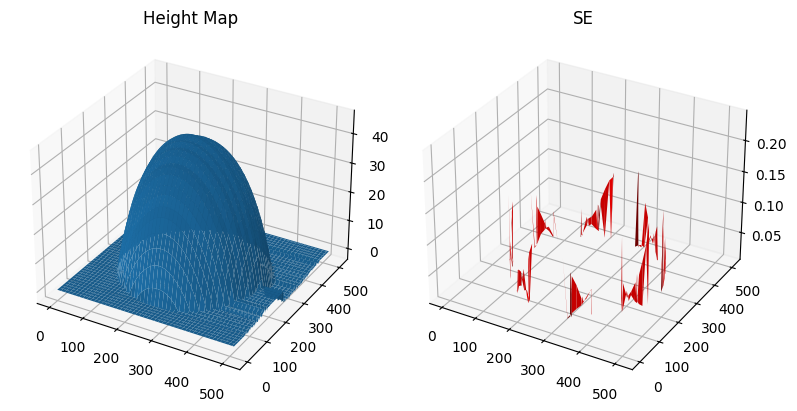

In [29]:
p, q, SE = check_integrability(normals_25)

height_map = construct_surface(p, q, "row")

# set the threshold for visualization
threshold = 0.01
SE[SE <= threshold] = float('nan')

print('Showing the surface reconstruction results for 5 light sources using row-major integration:')
show_results(None, normals_25, height_map, SE)

##### <font color='yellow'>Answer:</font>

>*Write your answer here.*

<a id="question-24"></a>
#### <font color='#FF0000'>Question 24 (3 points)</font>

Now, take the average of the results obtained from the column-major and row-major integration paths.

Do you observe any improvement compared to using only one path? Additionally, analyze whether the construction results vary when using different numbers of images in the reconstruction process. (So compare the results obtained from the GraySphere5 and GraySphere25 datasets.)

Showing the surface reconstruction results for 5 light sources using average integration:


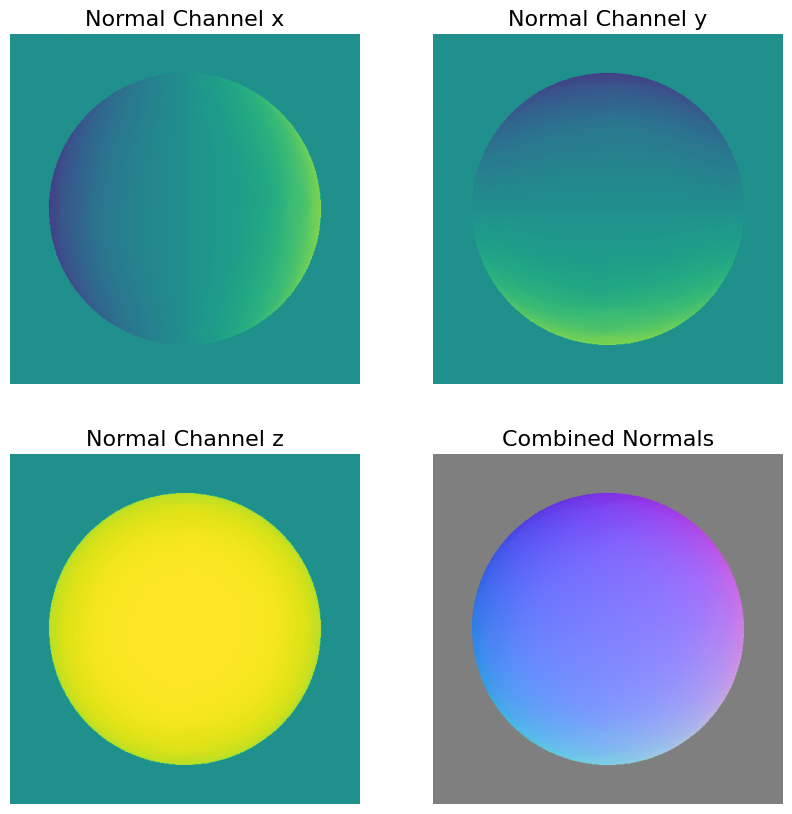

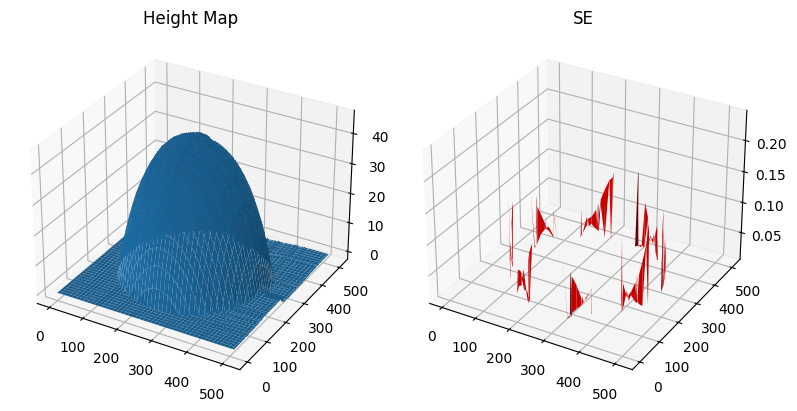

In [30]:
p, q, SE = check_integrability(normals_25)

height_map = construct_surface(p, q, "average")

# set the threshold for visualization
threshold = 0.01
SE[SE <= threshold] = float('nan')

print('Showing the surface reconstruction results for 5 light sources using average integration:')
show_results(None, normals_25, height_map, SE)

##### <font color='yellow'>Answer:</font>

>*Write your answer here.*

<a id="question-25"></a>
#### <font color='#FF0000'>Question 25 (3 points)</font>

Run the photometric stereo algorithm on the MonkeyGray model using the `photometric_stereo` function and display the results. Complete the provided code, execute the algorithm, and show the outcomes.

In [31]:
def photometric_stereo(image_dir='./photometrics_images/MonkeyGray/'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for a given set of images under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './images/photometrics_images/MonkeyGray/').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_synthetic_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of images and light source matrix
    print('Computing surface albedo and normal map...\n')

    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, True)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    p, q, SE = check_integrability(normals)

    threshold = 0.01
    SE[SE <= threshold] = float('nan')

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height
    print('Computing surface height map...\n')

    height_map = construct_surface(p, q, path_type='column')

    # show results
    print('Displaying results...\n')

    show_results(albedo, normals, height_map, SE)

If you estimate the albedo and surface normal for MonkeyGrat, the cell below will run for at least 20 seconds.

Loading images...

image size (h*w): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 3248

Computing surface height map...

Displaying results...

Albedo shape: (512, 512)


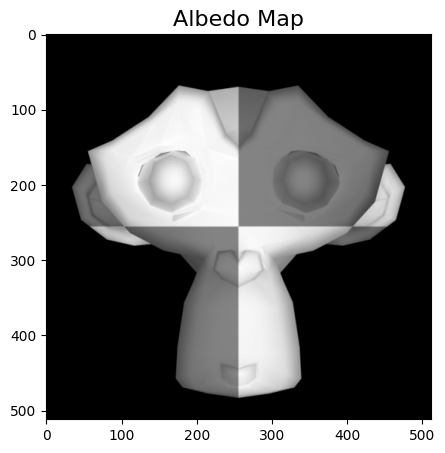

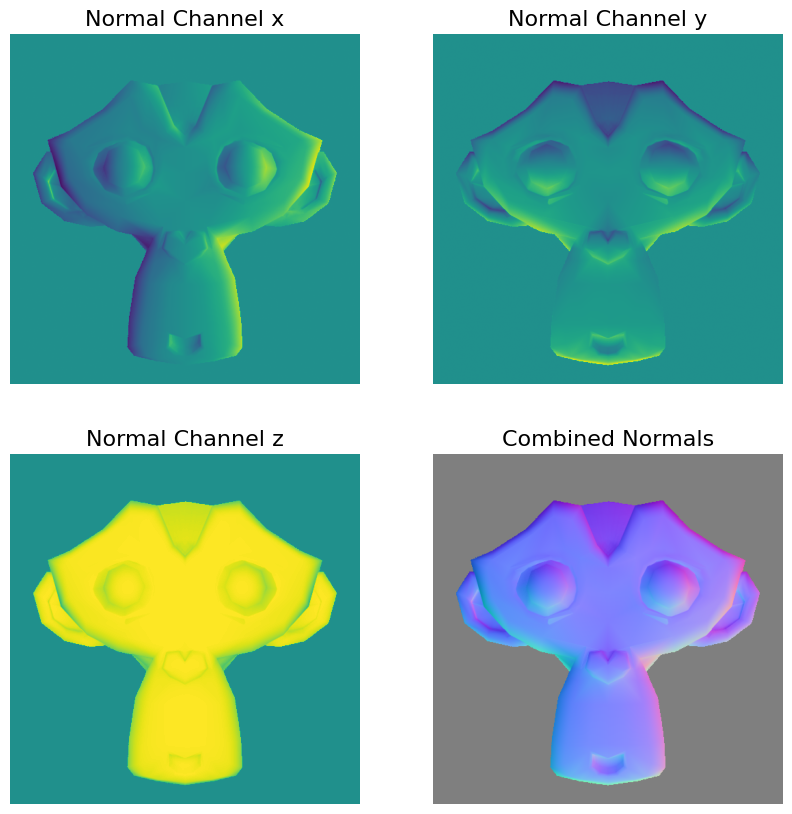

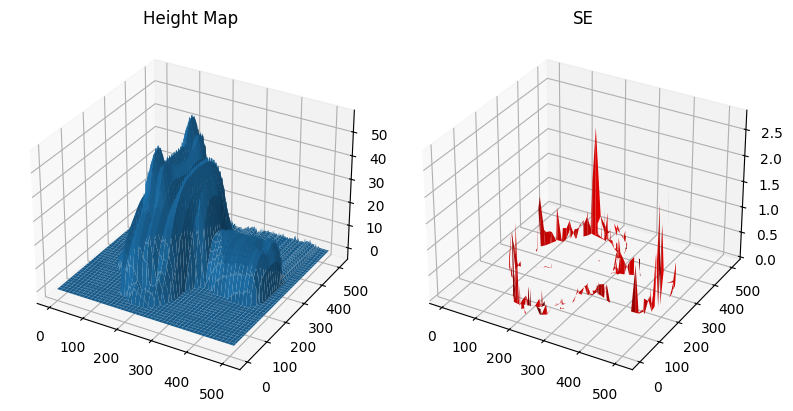

Albedo shape: (512, 512)


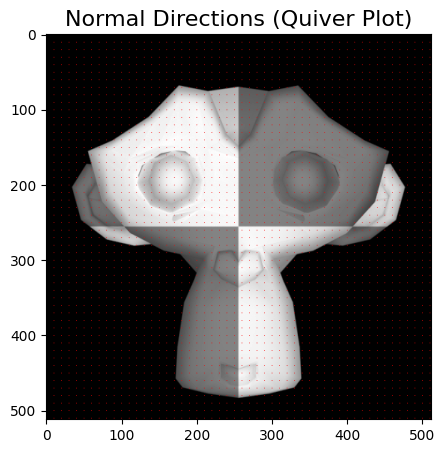

In [32]:
# Use the function
image_dir = './photometrics_images/MonkeyGray/'
photometric_stereo(image_dir)

<a id="question-26"></a>
#### <font color='#FF0000'>Question 26 (2 points)</font>

The albedo results for the MonkeyGray model may exhibit more errors compared to the sphere. Observe and describe the errors that arise when running the photometric stereo algorithm on the MonkeyGray model.

What could be the reasons for these errors? Experiment with different numbers of images, as you did in Question 15 and Question 18, to see the effects and discuss your observations.

##### <font color='yellow'>Answer:</font>

>*Write your answer here.*

<a id="question-27"></a>
#### <font color='#FF0000'>Question 27 (2 points)</font>

Considering the errors observed in the albedo results for the MonkeyGray model, what do you think could help in reducing or solving these errors? Provide your thoughts on potential strategies or methods that might improve the accuracy of the results.

##### <font color='yellow'>Answer:</font>

>*Write your answer here.*

<a id="question-28"></a>
#### <font color='#FF0000'>Question 28 (5 points)</font>

So far, we have assumed that albedos and input images are 1-channel grayscale images. To work with 3-channel RGB images, a simple approach is to split the input image into separate channels and treat them individually. However, this method may introduce issues when constructing the surface normal map if a pixel value in a channel is zero.

Update the implementation to work with 3-channel RGB inputs. Complete the functions `load_synthetic_images_rgb` and `estimate_albedo_and_normals_rgb ` to handle RGB images, and test your updated implementation with the SphereColor and MonkeyColor models using the `photometric_stereo_rgb` function. Make sure to display the results.

In [33]:
def load_synthetic_images_rgb(image_dir):
    """
    Loads synthetic RGB images and light directions.

    This function reads images from the specified directory, processes each color channel separately, 
    and stacks them together along with their corresponding light directions.

    Args:
        image_dir: Path to the directory containing the images.

    Returns:
        A tuple containing the image stack and the light directions.
    """

    image_stack_red, scriptV_red = load_synthetic_images(image_dir, channel=0)
    image_stack_green, scriptV_green = load_synthetic_images(image_dir, channel=1)
    image_stack_blue, scriptV_blue = load_synthetic_images(image_dir, channel=2)

    image_stack_rgb = np.stack([image_stack_red, image_stack_green, image_stack_blue], axis=-1)
    scriptV_rgb = np.stack([scriptV_red, scriptV_green, scriptV_blue], axis=-1)

    return image_stack_rgb, scriptV_rgb

In [34]:
def estimate_albedo_and_normals_rgb(image_stack, scriptV, shadow_trick=True):
    """
    Estimates albedo and normals from a stack of RGB images and light directions.

    This function processes each color channel separately to estimate the albedo and normal maps.
    The results from each channel are then combined to produce the final albedo and normal maps.

    Args:
        image_stack: Image stacks for each color channel.
        scriptV: Light directions for each color channel.
        shadow_trick: Whether or not to use the shadow trick. Defaults to True.

    Returns:
        A tuple containing the albedo and normal maps.
    """

    h, w, _, _ = image_stack.shape

    albedo_rgb = np.zeros([h, w, 3])
    normals_rgb = np.zeros([h, w, 3, 3])

    # Calulate albedo and normals
    for c in range(3):
        image_stack_rgb = image_stack[:, :, :, c]
        scriptV_rgb = scriptV[:, :, c]
        albedo, normals = estimate_albedo_and_normals(image_stack_rgb, scriptV_rgb)

        albedo_rgb[:, :, c] = albedo
        normals_rgb[:, :, :, c] = normals

    return albedo_rgb, normals_rgb

In [35]:
def photometric_stereo_rgb(image_dir='./SphereColor/'):
    """
    Performs photometric stereo on RGB images to estimate the surface albedo, normals, and height map.

    This function loads RGB images from the specified directory, computes the surface albedo and 
    normal maps, checks integrability, reconstructs the surface height map, and displays the results.

    Args:
        image_dir: Path to the directory containing the images.
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_synthetic_images_rgb(image_dir)
    [h, w, n, c] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of images and light source matrix
    print('Computing surface albedo and normal map...\n')

    albedo, normals_rgb = estimate_albedo_and_normals_rgb(image_stack, scriptV, True)
    normals = np.mean(normals_rgb, axis=-1)
                      
    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    p, q, SE = check_integrability(normals)

    threshold = 0.01
    SE[SE <= threshold] = float('nan')

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height
    print('Computing surface height map...\n')

    height_map = construct_surface(p, q, path_type='column')

    # show results
    print('Displaying results...\n')

    show_results(albedo, normals, height_map, SE)

If you estimate the albedo and surface normal for SphereColor and MonkeyColor, the cell below will run for atleast 1 or 2 minutes.

Loading images...

image size (h*w): 512*512
image size (h*w): 512*512
image size (h*w): 512*512
Finish loading 25 images.

Computing surface albedo and normal map...



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.333054080114076].


Integrability checking

Number of outliers: 1559

Computing surface height map...

Displaying results...

Albedo shape: (512, 512, 3)


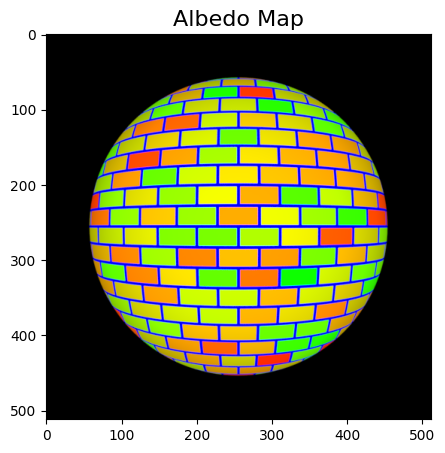

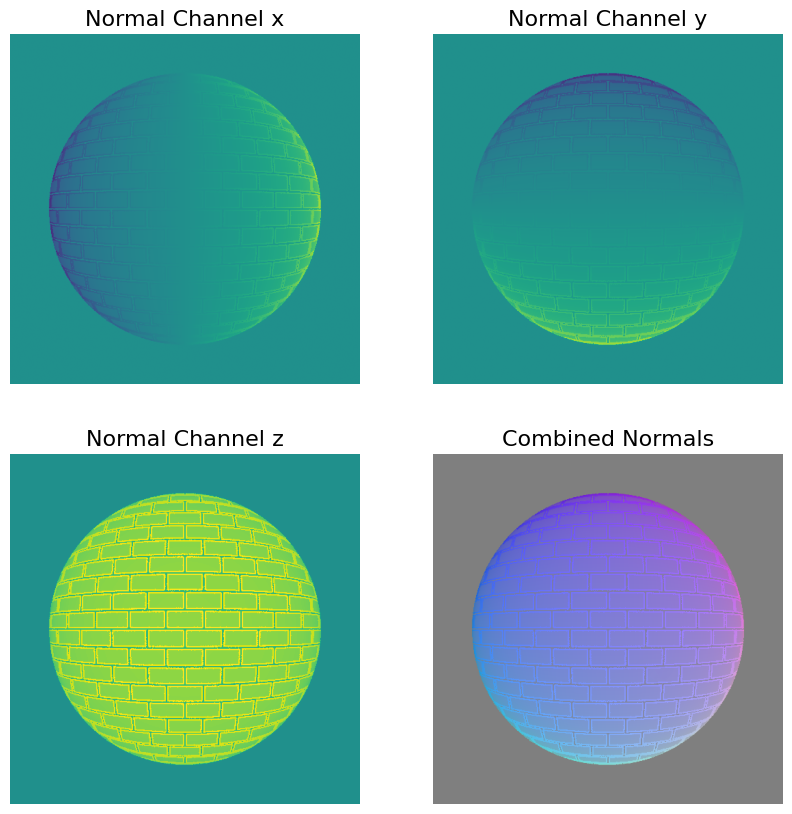

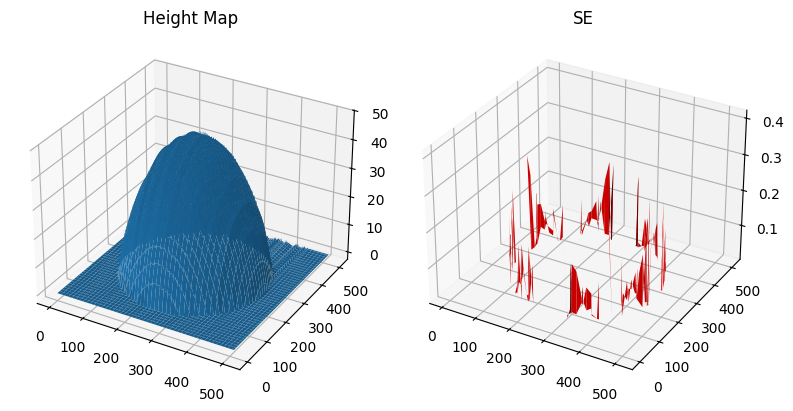

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.333054080114076].


Albedo shape: (512, 512, 3)


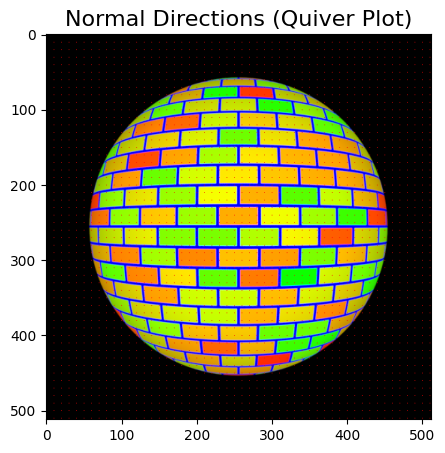

In [36]:
image_dir = './photometrics_images/SphereColor/'
# image_dir = './photometrics_images/MonkeyColor/'

photometric_stereo_rgb(image_dir)

<a id="question-29"></a>
#### <font color='#FF0000'>Question 29 (2 points)</font>

Explain the changes made to the function and discuss the results of these changes.

##### <font color='yellow'>Answer:</font>

To make the previous functions work with 3-channel RGB inputs, we made the following changes:

- The function load_synthetic_images_rgb() works to load each color channel separately by using the original load_synthetic_images(). With each color processed, we stack the images in a 4-dimensional array where the third channel represents the the images and the fourth channel is for the color channel. We do the same for the light directions.
- The function estimate_albedo_and_normals_rgb() works to calculate each color channel albedo and surface normals using the original estimate_albedo_and_normals() function. Each result is also combined into a new array.
- Finally, the function photometric_stereo_rgb() mirrors the original photometric_stereo() function to work the same way but use the new 3-channel images as inputs. It checks the integrability and construcs the surface height map the same way as before.

The results show a clearly more detailed albedo and surface normal maps, since they now show a more precise representation of the surface in a RGB space. With these changes, the accuracy of the photometric stereo results improved significantly.

<a id="question-30"></a>
#### <font color='#FF0000'>Question 30 (2 points)</font>

Observe the problem in the constructed surface normal map and height map. Explain why a zero pixel could be a problem and propose a way to overcome that.

##### <font color='yellow'>Answer:</font>

A zero pixel can be a problem for the surface normal map and the height map since it indicates a lack of information about the surface orientation at that point. Consequentialy, This affects the integration process used to construct the surface height map since it depends on continuity and can create abrupt changes such as spikes or dips.

A way in which one might overcome this issue is to replace the zero-valued pixel with an estimate based on the information stored by its neighborings pixels.

<a id="question-31"></a>
#### <font color='#FF0000'>Question 31 (4 points)</font>

Now, it's time to apply the algorithm to real-world datasets. We will first use the Yale Face Database.

For the Face dataset, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface height
- Show the results

Run the algorithm for the Yale Face images: [Yale Face Database](http://cvc.cs.yale.edu/cvc/projects/yalefaces/yalefaces.html). The Yale face data is included in the lab material. The `load_face_images` function is provided as a helper. You should complete the `photometric_stereo_face_dataset` function as part of this task.

Make sure to display the results for the Face dataset using the 3 paths (column-major, row-major, and average) when constructing the surface height map.

**Hint**: For proper computation of albedo and surface normal, you may want to suspend the shadow trick described in the text, and use the original formula:
$$i = Vg(x,y)$$

In [37]:
def load_face_images(image_dir='./photometrics_images/yaleB02/'):
    """
    Loads a set of face images from the Yale Face Database and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Yale Face images. Defaults to './photometrics_images/yaleB02/'.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with the ambient image subtracted and normalized.
            - scriptV: An array of light direction vectors corresponding to each image.
    """
    
    # define the number of images to load
    num_images = 64
    
    # load the ambient image (the image without any lighting)
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)
    
    # get the height and width of the ambient image
    h, w = ambient_image.shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the yaleB02 face dataset
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    
    # randomly select a subset of images to match the num_images count
    import random
    d = random.sample(d, num_images)
    
    # extract the base filenames from the list of image paths
    filenames = [os.path.basename(x) for x in d]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # extract the lighting angles from the filename
        ang[0,j], ang[1,j] = np.double(filenames[j][12:16]), np.double(filenames[j][17:20])
        
        # load the image and subtract the ambient image to get the actual illumination effect
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1) - ambient_image

    # calculate the light direction vectors based on the extracted angles
    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    
    # combine the direction vectors, adjusting for normal direction
    scriptV = [-1,-1,1] * np.array([y,z,x]).transpose(1,0)  ##eggonz COMMENT: fix (-1,-1,1) normal directiona

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack<0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV

In [38]:
def photometric_stereo_face_dataset(image_dir='./photometrics_images/yaleB02/', path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Yale Face Dataset under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './images/photometrics_images/yaleB02/').
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_face_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, False)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    p, q, SE = check_integrability(normals)

    threshold = 0.01
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')

    # compute the surface height map
    print('Computing surface height map...\n')

    height_map = construct_surface(p, q, path_type)

    # show results
    print('Displaying results...\n')

    show_results(albedo, normals, height_map, SE)

    return height_map, SE

If you estimate the albedo and surface normal using the three path types, the cell below will run for at least 10 seconds.

Column Results
Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 572

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


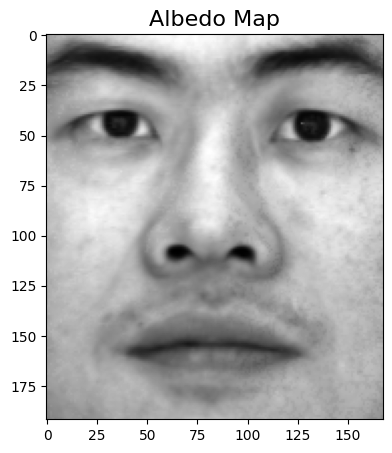

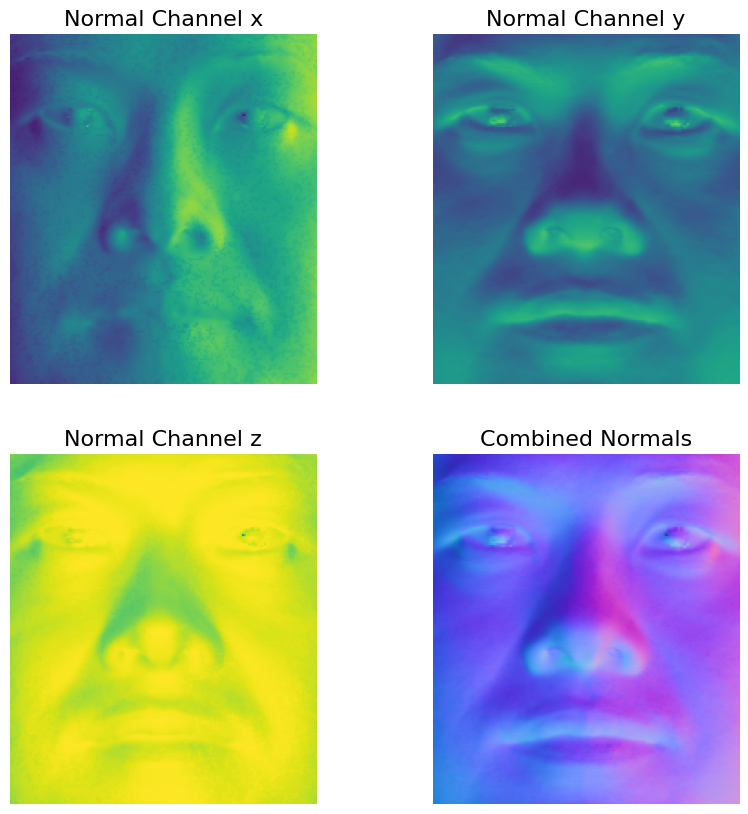

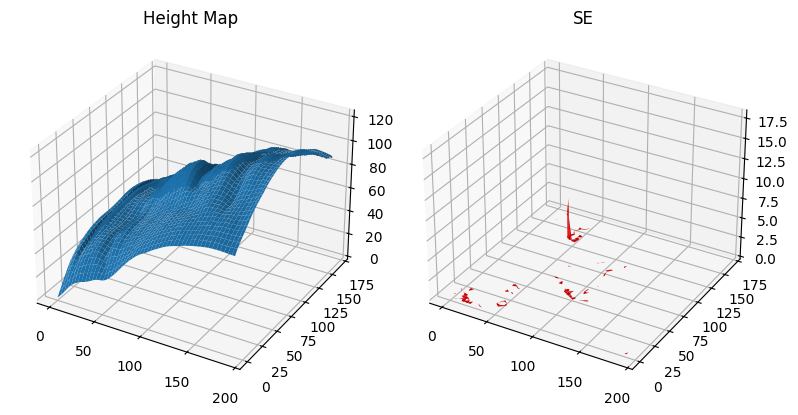

Albedo shape: (192, 168)


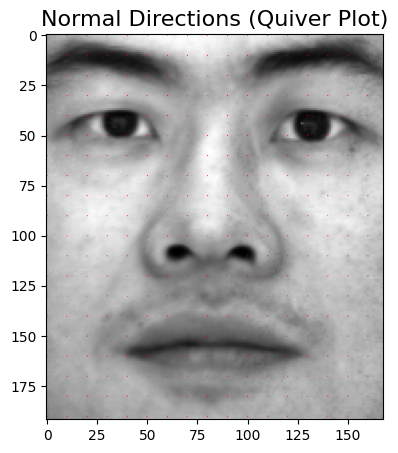

Row Results
Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 572

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


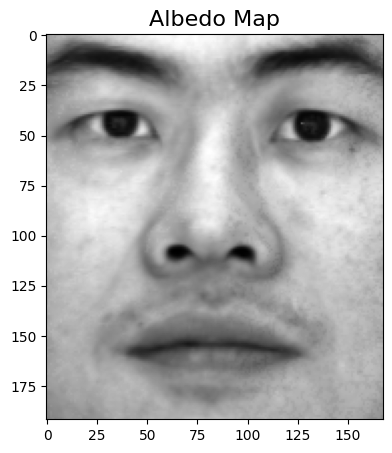

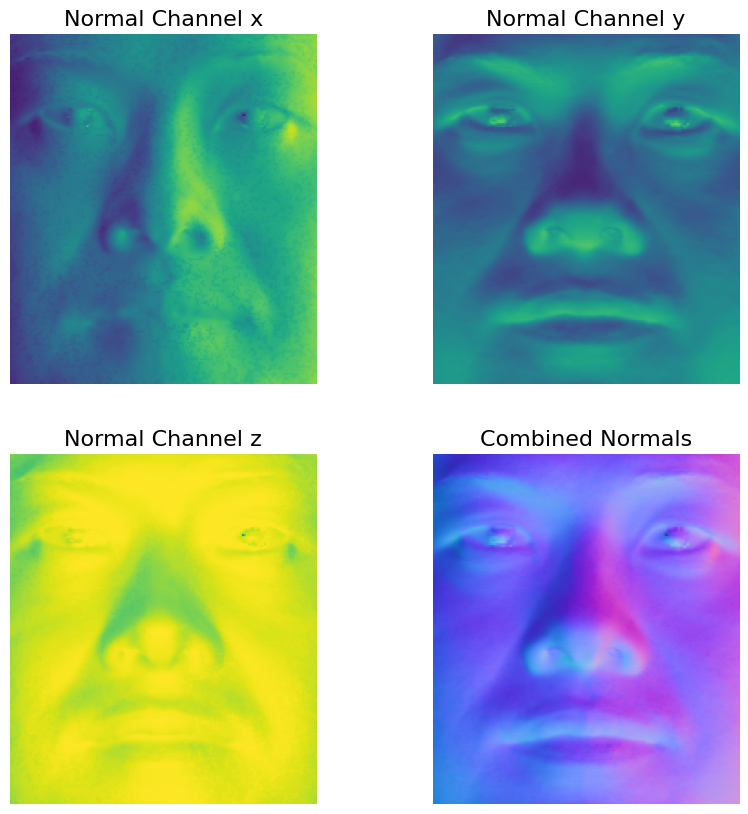

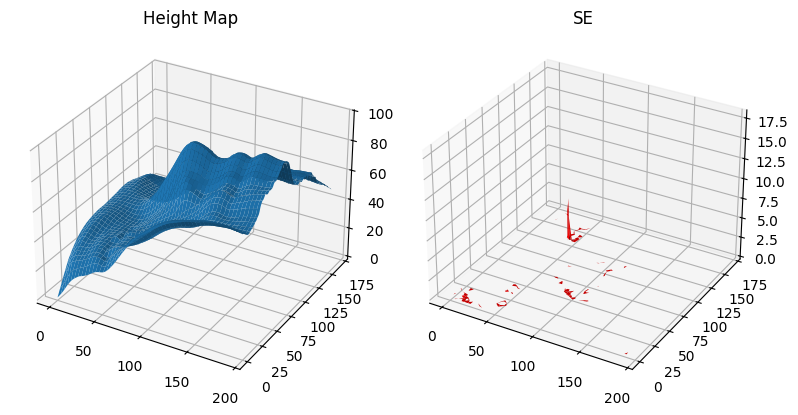

Albedo shape: (192, 168)


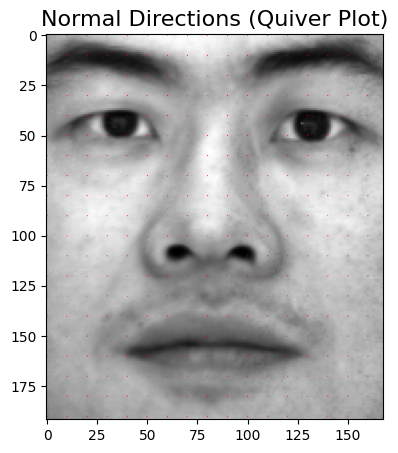

Average Results
Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 572

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


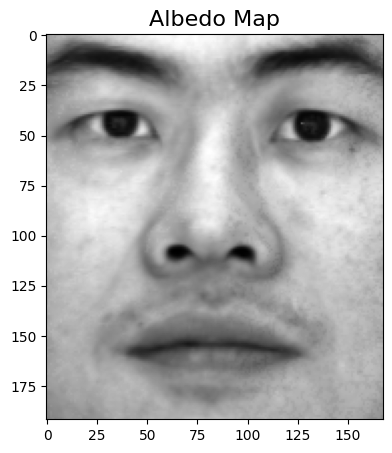

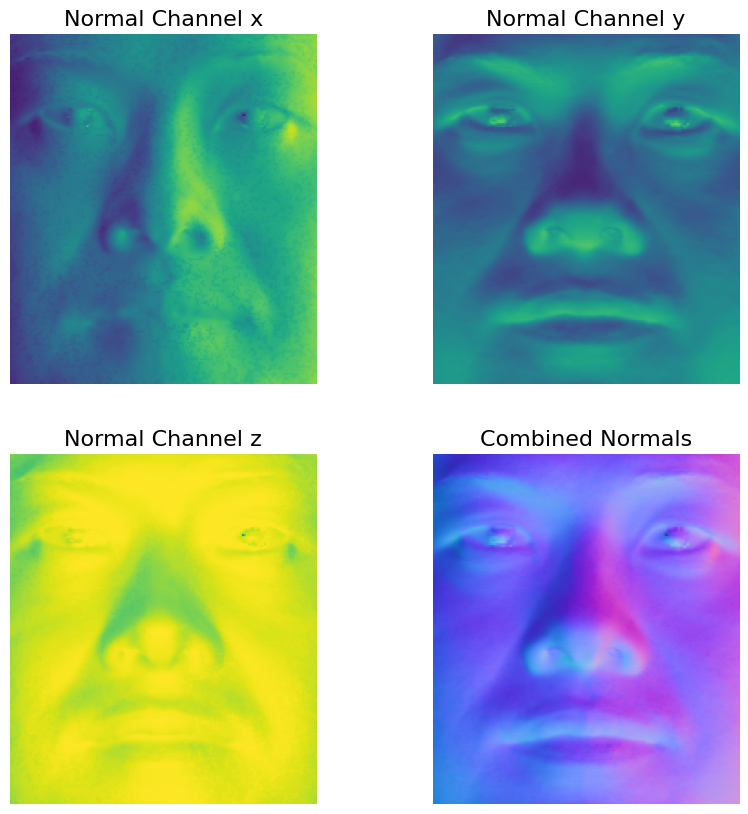

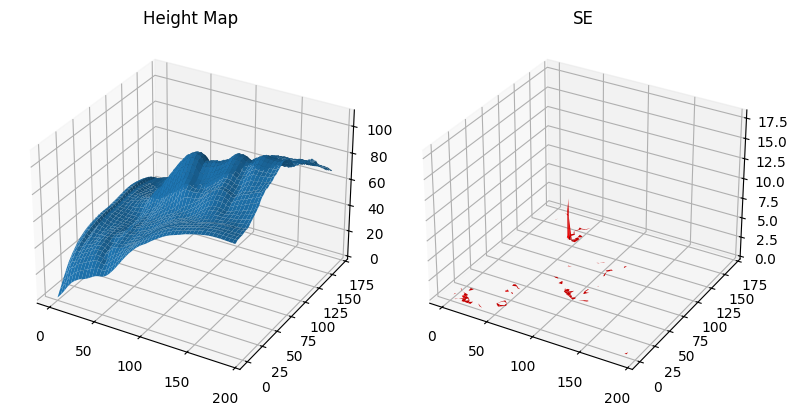

Albedo shape: (192, 168)


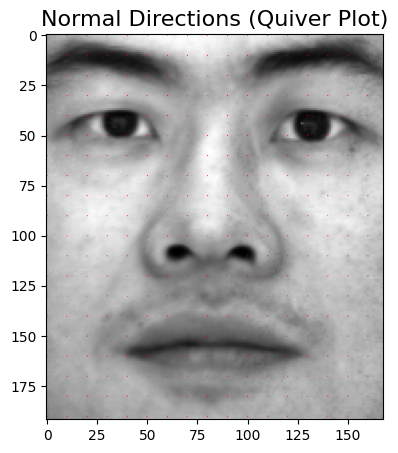

MSE (Row vs Column): 440.3093300851179
MSE (Average vs Column): 110.07733252127971
MSE (Average vs Row): 110.07733252127925
Mean Integrability Error (Column): 0.10470338930552735
Mean Integrability Error (Row): 0.10470338930552756
Mean Integrability Error (Average): 0.10470338930552758


In [39]:
print("Column Results")
height_map_column, SE_column = photometric_stereo_face_dataset(path_type='column')

print("Row Results")
height_map_row, SE_row= photometric_stereo_face_dataset(path_type='row')

print("Average Results")
height_map_average, SE_average = photometric_stereo_face_dataset(path_type='average')

# Numerical comparison of height maps
mse_row_vs_column = np.nanmean((height_map_row - height_map_column) ** 2)
mse_average_vs_column = np.nanmean((height_map_average - height_map_column) ** 2)
mse_average_vs_row = np.nanmean((height_map_average - height_map_row) ** 2)

print(f"MSE (Row vs Column): {mse_row_vs_column}")
print(f"MSE (Average vs Column): {mse_average_vs_column}")
print(f"MSE (Average vs Row): {mse_average_vs_row}")

# Compare integrability errors
mean_SE_column = np.nanmean(SE_column)
mean_SE_row = np.nanmean(SE_row)
mean_SE_average = np.nanmean(SE_average)

print(f"Mean Integrability Error (Column): {mean_SE_column}")
print(f"Mean Integrability Error (Row): {mean_SE_row}")
print(f"Mean Integrability Error (Average): {mean_SE_average}")

<a id="question-32"></a>
#### <font color='#FF0000'>Question 32 (1 point)</font>

Observe and discuss the results for different integration paths in the `photometric_stereo_face_dataset` function.

##### <font color='yellow'>Answer:</font>

As we can see from the graphs or by using the Mean Square Errors calculation, the height maps constructed using the Row-major and Column-major paths are signicantly different, resulting in a higher MSE between these two. On the other hand, using the Average-path method results in a height map that aligns with each of the other two methods more closely, which is shown by the lower MSE in both cases. 

What we can interpret from these results is that the Average-path method results in a more balanced surface reconstruction, and is probably the most accurate method to use since it yields results with lower errors with respect to each of the other methods. At the same time, the higher difference between the Row and Column paths ilustrates how the choice of the integration paths can significantly affect the map reconstruction.

Additionally, the integrability errors from all the paths are very similar, implying that the integrability of the normals is handle almost equally in all of them. This result indicates that the differences on the reconstructed surfaces are more influenced by the way the surface is analyzed and reconstructed than on the way the gradient calculations are handled.

<a id="question-33"></a>
#### <font color='#FF0000'>Question 33 (2 points)</font>

Discuss how the images violate the assumptions of the shape-from-shading methods. Include specific input images to illustrate your points.

##### <font color='yellow'>Answer:</font>

The shape-from-shading method we are applying with these functions makes several assumptions to approximate the problem to ideal conditions, including <a name="cite_ref-1"></a>[<sup>[1]</sup>](#cite_note-1):

- Lambertian Reflectance, that assumes all the surfaces reflect the light uniformly in all directions, implying that the observed intensity if any point on the surface depends on the angle between the normal of the surface and the light source direction.
- Single Point Light Source, that assumes the illumination comes from a single point that is really far away and iluminates all the surface, making the light source direction be known and the same for all points.
- No Ambient Illumination, which assumes there is no ambient light, which doesn't consider the contribution of shadow regions.
- Smooth Surfaces, which assumes the surface is always smooth and continuous. When using the derivates method to calculate the surface's normals, this assumption allows us to assume that the second partial derivates are equal. This is rarely the case when calculating the SE of the gradient, as we saw before.

<a name="cite_note-1"></a><small>[1.](#cite_ref-1) Forsyth, D. and Ponce, J. Sources, Shadows and Shading. Computer Vision: A Modern Approach, pages 33-40, 2011.</small>

<a id="question-34"></a>
#### <font color='#FF0000'>Question 34 (2 points)</font>

How would the results improve when the problematic images are removed? Try it out and show the results in your notebook.

To complete this task, you should implement the `load_face_images_filtered` and `photometric_stereo_face_filtered` functions.

In [40]:
def load_face_images_filtered(image_dir='./photometrics_images/yaleB02/', bad_images=[]):
    """
    Loads a set of face images from the Yale Face Database, excluding problematic ones, and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Yale Face images. Defaults to './photometrics_images/yaleB02/'.
        bad_images: A list of filenames to exclude from the image stack.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with the ambient image subtracted, normalized, and problematic images removed.
            - scriptV: An array of light direction vectors corresponding to each image.
    """
    
    # load the ambient image (the image without any lighting)
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)
    
    # get the height and width of the ambient image
    h, w = ambient_image.shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the yaleB02 face dataset
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    d = [f for f in d if os.path.join(image_dir, os.path.basename(f)) not in bad_images]

    # define the number of images to load
    num_images = min(64, len(d))
    
    # randomly select a subset of images to match the num_images count
    import random
    d = random.sample(d, num_images)
    
    # extract the base filenames from the list of image paths
    filenames = [os.path.basename(x) for x in d]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # extract the lighting angles from the filename
        ang[0,j], ang[1,j] = np.double(filenames[j][12:16]), np.double(filenames[j][17:20])
        
        # load the image and subtract the ambient image to get the actual illumination effect
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1) - ambient_image

    # calculate the light direction vectors based on the extracted angles
    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    
    # combine the direction vectors, adjusting for normal direction
    scriptV = [-1,-1,1] * np.array([y,z,x]).transpose(1,0)  ##eggonz COMMENT: fix (-1,-1,1) normal directiona

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack<0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV

In [41]:
def photometric_stereo_face_filtered(bad_images=[], image_dir='./photometrics_images/yaleB02/', shadow_trick=False, path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Yale Face Dataset, excluding problematic images.

    Args:
        bad_images: A list of filenames to exclude from the image stack (default is an empty list).
        image_dir: Directory containing the input images (default is './photometrics_images/yaleB02/').
        shadow_trick: Whether or not to use the shadow trick for albedo and normal estimation (default is False).
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_face_images_filtered(image_dir, bad_images)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    p, q, SE = check_integrability(normals)

    threshold = 0.01
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')

    # compute the surface height map
    print('Computing surface height map...\n')

    height_map = construct_surface(p, q, path_type)

    # show results
    print('Displaying results...\n')

    show_results(albedo, normals, height_map, SE)

    return height_map, SE

Column Results
Loading images...

Finish loading 49 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 538

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


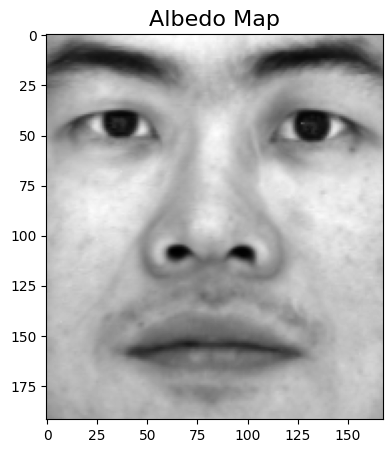

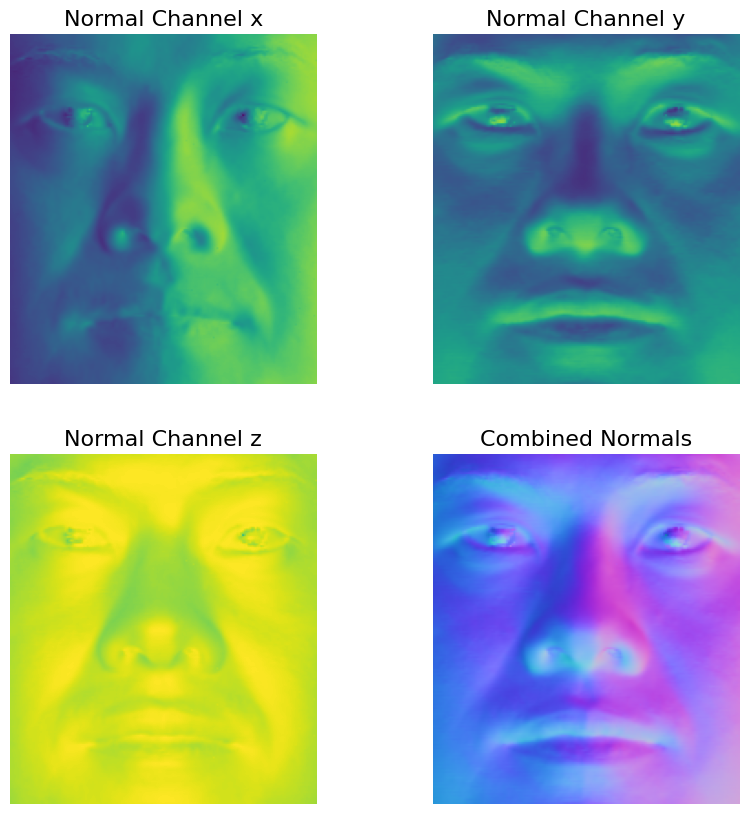

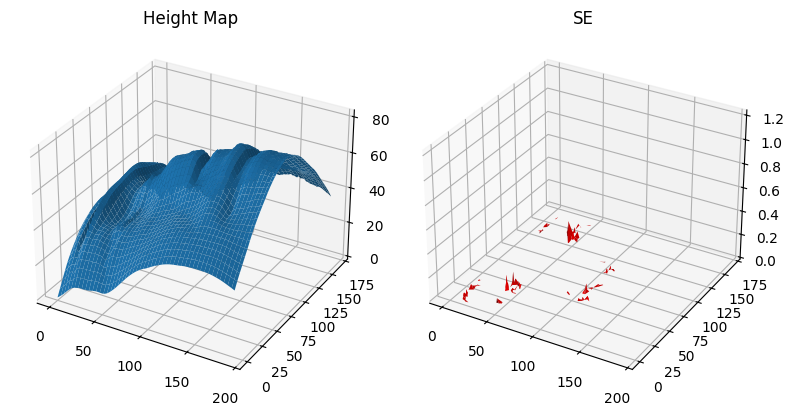

Albedo shape: (192, 168)


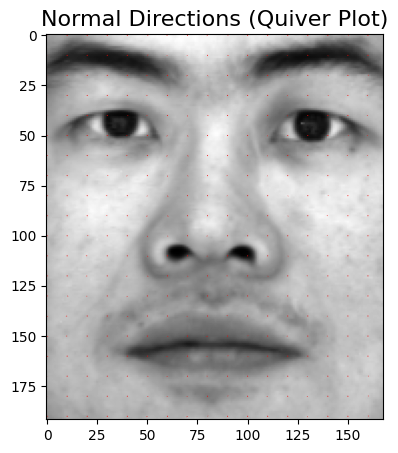

Row Results
Loading images...

Finish loading 49 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 538

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


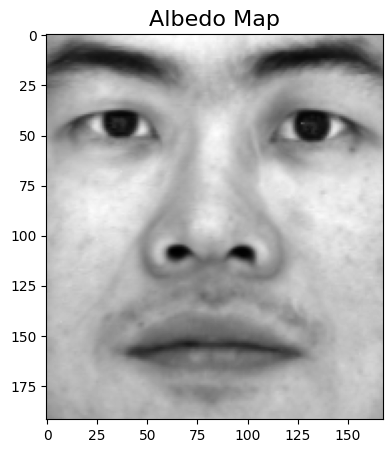

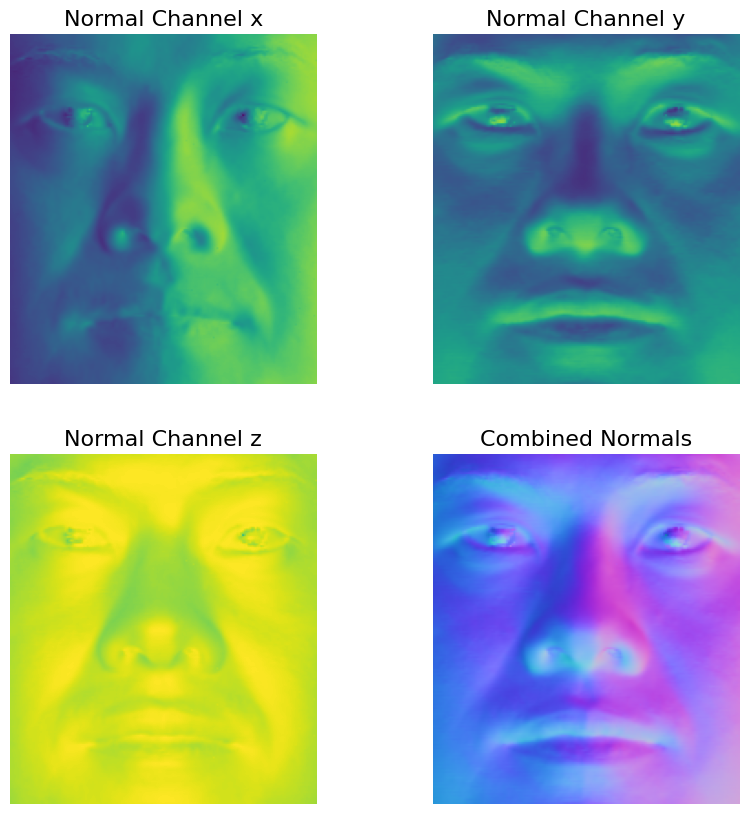

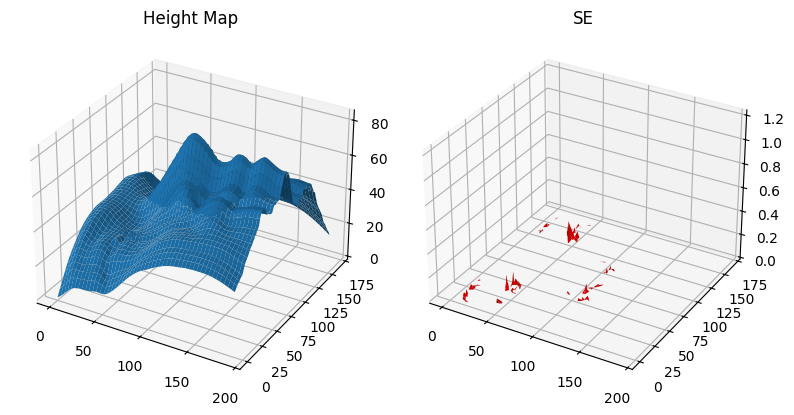

Albedo shape: (192, 168)


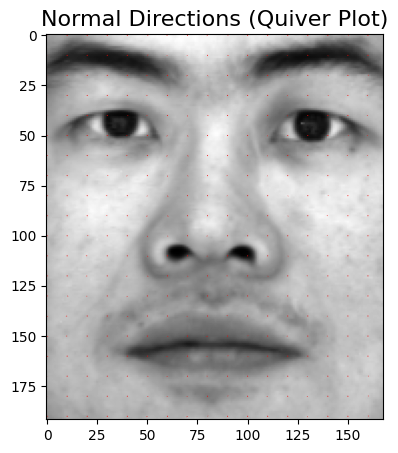

Average Results
Loading images...

Finish loading 49 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 538

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


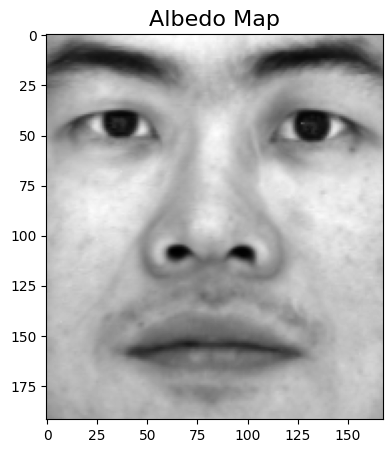

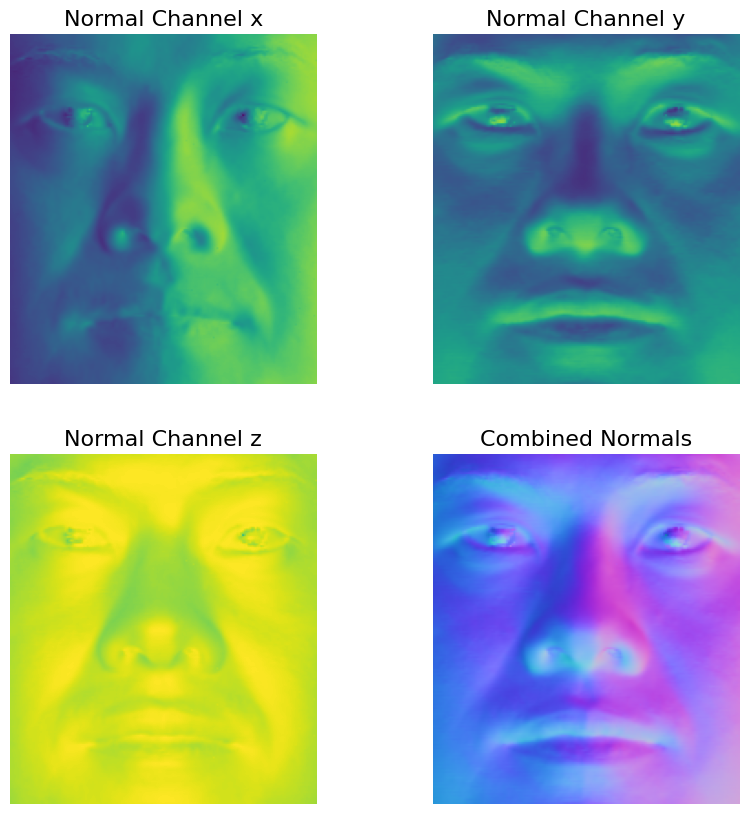

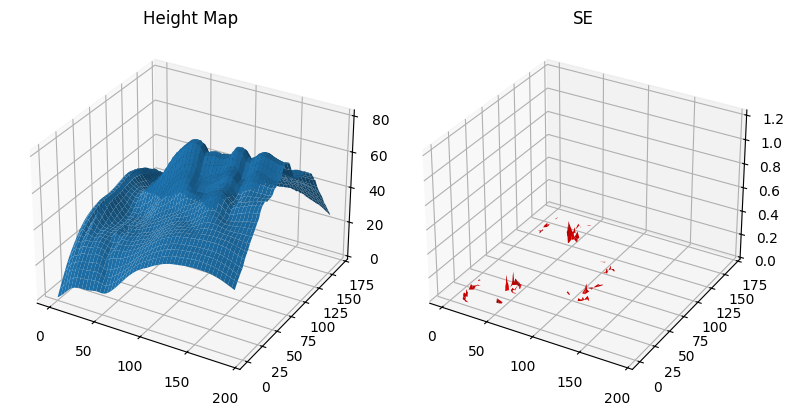

Albedo shape: (192, 168)


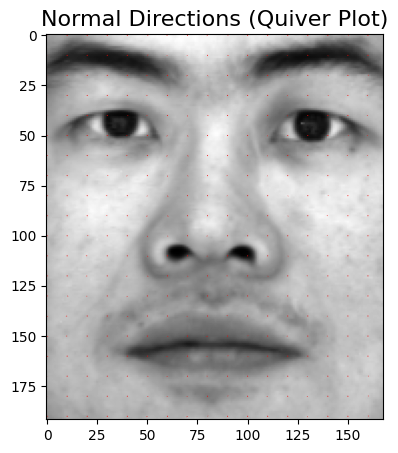

MSE (Row vs Column): 74.54126541850573
MSE (Average vs Column): 18.635316354627225
MSE (Average vs Row): 18.63531635462564
Mean Integrability Error (Column): 0.03029726189339884
Mean Integrability Error (Row): 0.03029726189339884
Mean Integrability Error (Average): 0.030297261893398767


In [42]:
def intensity_filter(img, total_threshold=0.7, dark_threshold=0.15, bright_threshold=0.85):
    """
    Mark which images have too many pixels that are either too dark or too bright.
    """
    total_pixels = img.size
    outbound_pixels = (img > bright_threshold) | (img < dark_threshold)
    percentage = (np.sum(outbound_pixels) / total_pixels) # outbounds pixels are 1 or 0
    
    return percentage > total_threshold

image_dir='./photometrics_images/yaleB02/'
filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
ambient_image = cv2.imread(filename, -1)

d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
bad_images = [img for img in d if intensity_filter((cv2.imread(img, -1) - ambient_image) / 255.0)]

print("Column Results")
height_map_column, SE_column = photometric_stereo_face_filtered(bad_images, path_type='column')

print("Row Results")
height_map_row, SE_row= photometric_stereo_face_filtered(bad_images, path_type='row')

print("Average Results")
height_map_average, SE_average = photometric_stereo_face_filtered(bad_images, path_type='average')

# Numerical comparison of height maps
mse_row_vs_column = np.nanmean((height_map_row - height_map_column) ** 2)
mse_average_vs_column = np.nanmean((height_map_average - height_map_column) ** 2)
mse_average_vs_row = np.nanmean((height_map_average - height_map_row) ** 2)

print(f"MSE (Row vs Column): {mse_row_vs_column}")
print(f"MSE (Average vs Column): {mse_average_vs_column}")
print(f"MSE (Average vs Row): {mse_average_vs_row}")

# Compare integrability errors
mean_SE_column = np.nanmean(SE_column)
mean_SE_row = np.nanmean(SE_row)
mean_SE_average = np.nanmean(SE_average)

print(f"Mean Integrability Error (Column): {mean_SE_column}")
print(f"Mean Integrability Error (Row): {mean_SE_row}")
print(f"Mean Integrability Error (Average): {mean_SE_average}")

<a id="question-35"></a>
#### <font color='#FF0000'>Question 35 (1 point)</font>

Discuss the results obtained after removing the problematic images. What are the differences in the results, and how do they compare to the original results?

##### <font color='yellow'>Answer:</font>

After removing all the images were more than 70% of their pixels were very bright or dark, the results improved significantly. Almost all the errors were reduced by a factor of 6, which indicates that the differences between each reconstruction path is smaller when using the filtered images. 

At the same time, this means that the images with problematic lighting conditions contribute a lot to the variability of the reconstructions. The lower integrability errors show that the surface normals are now more consistent, meaning that the problematic images were also adding larger deviations from the surface gradients.

This results highlight the importance of the input data and its preprocessing.

<a id="question-36"></a>
#### <font color='#FF0000'>Question 36 (4 points)</font>

Now, it's time to apply the algorithm to the Apple dataset using real-world 3-channel RGB inputs.

For the Apple dataset, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface height
- Show the results

Use the images in the "Apple" folder. The `load_apple_images` function is provided as a helper. You should complete the `photometric_stereo_apple_dataset` function as part of this task.

Observe and discuss the results for different integration paths. You may encounter difficulties using this non-synthetic dataset—try if filtering may help.

Make sure to display the results using the 3 paths (column-major, row-major, and average) when constructing the surface height map.

In [43]:
def load_apple_images(image_dir='./photometrics_images/Apple'):
    """
    Loads a set of apple images from the Apple dataset and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Apple images. Defaults to './photometrics_images/Apple/'.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with only the red channel extracted and normalized.
            - scriptV: An array of light direction vectors corresponding to each image.
    """

    # define the number of images to load
    num_images = 99
    
    # load a sample image to determine its dimensions
    filename = os.path.join(image_dir, 'I_0000.png')
    try_image = cv2.imread(filename, -1)
    
    # get the height and width of the sample image
    h, w = try_image[:,:,0].shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the Apple dataset
    d = glob.glob(os.path.join(image_dir, 'I_00*.png'))
    
    # randomly select a subset of images to match the num_images count
    import random
    d = random.sample(d, num_images)
    
    # extract the base filenames from the list of image paths and their corresponding indices
    filenames = [os.path.basename(x) for x in d]
    filenames_idx = [int(i.split('_')[1].split('.')[0]) for i in filenames]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # load the image and extract the red channel (index 2)
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1)[:,:,2]

    # read light direction vectors from the provided file
    with open('./photometrics_images/Apple/light_directions_refined.txt') as file:
        lines = [line.split() for line in file]
        x, y, z = [], [], []
        
        # extract light directions corresponding to the selected images
        for idx in filenames_idx:
            x.append(float(lines[idx][0]))
            y.append(float(lines[idx][1]))
            z.append(float(lines[idx][2]))

    # combine the direction vectors, adjusting for normal direction
    scriptV = [1,-1,1] * np.array([x,y,z]).transpose(1,0)  ##eggonz COMMENT: fix (1,-1,1) normal directiona

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack < 0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV

In [44]:
def photometric_stereo_apple_dataset(image_dir='./photometrics_images/Apple/', path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Apple Dataset under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './photometrics_images/Apple/').
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_apple_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, False)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    p, q, SE = check_integrability(normals)

    threshold = 0.01
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')

    height_map = construct_surface(p, q, path_type)

    # show results
    print('Displaying results...\n')

    show_results(albedo, normals, height_map, SE)

    return height_map, SE

If you estimate the albedo and surface normal using the three path types, the cell below will run for at least 1 minute.

Column Results
Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 2709

Computing surface height map...

Displaying results...

Albedo shape: (696, 646)


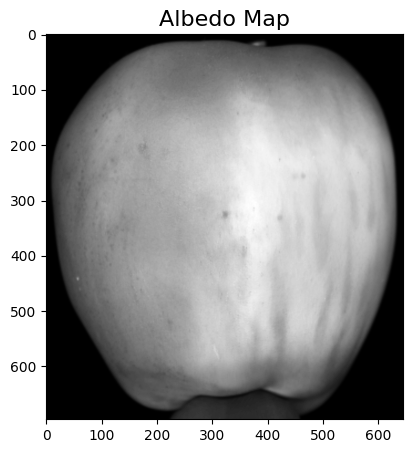

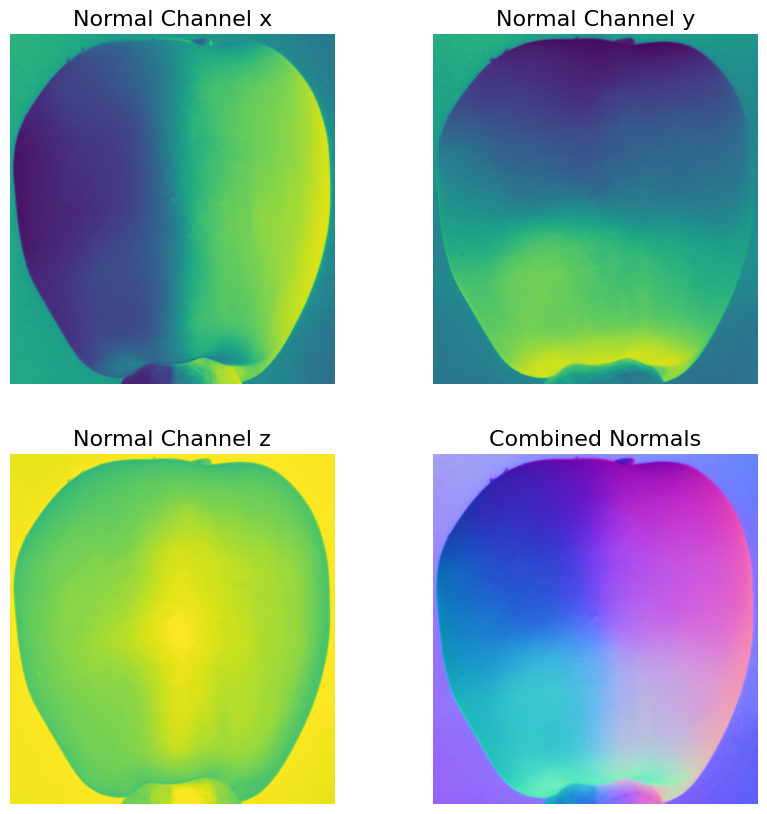

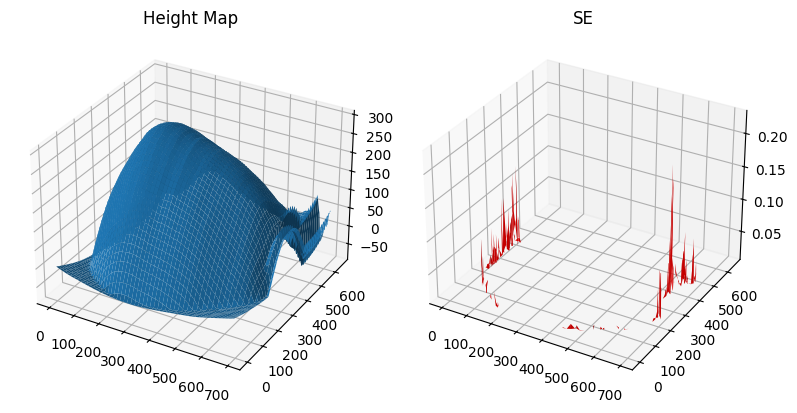

Albedo shape: (696, 646)


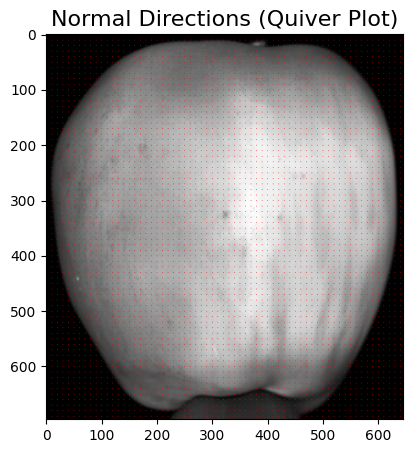

Row Results
Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 2709

Computing surface height map...

Displaying results...

Albedo shape: (696, 646)


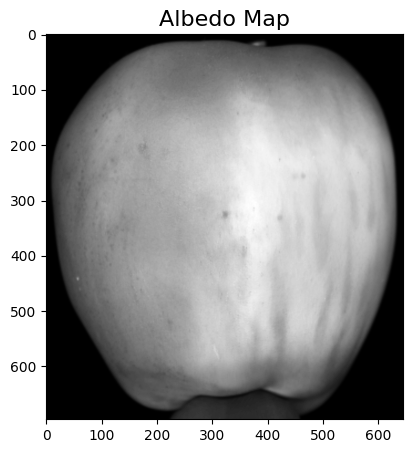

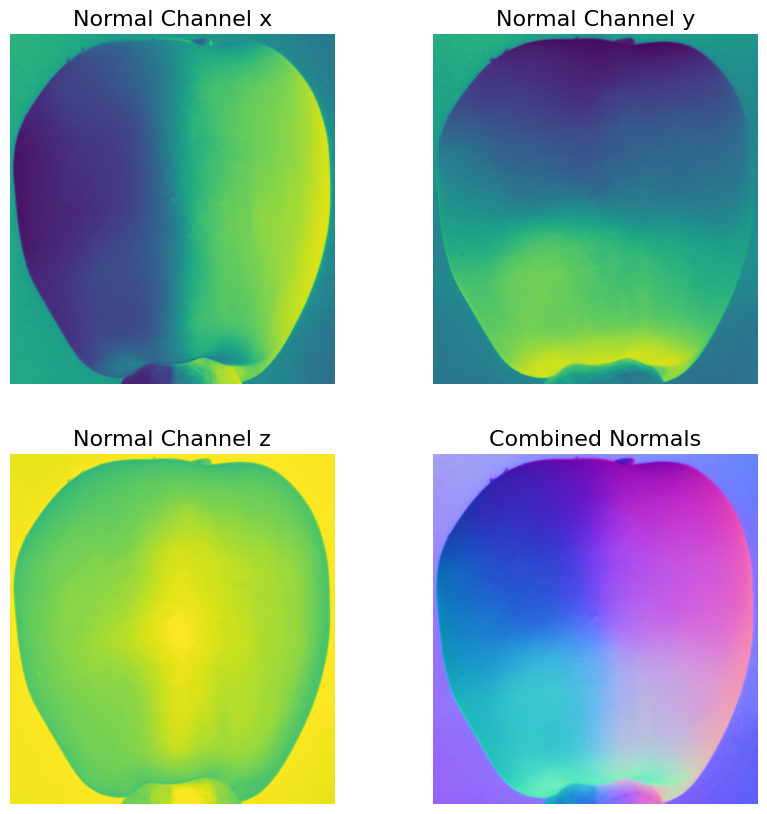

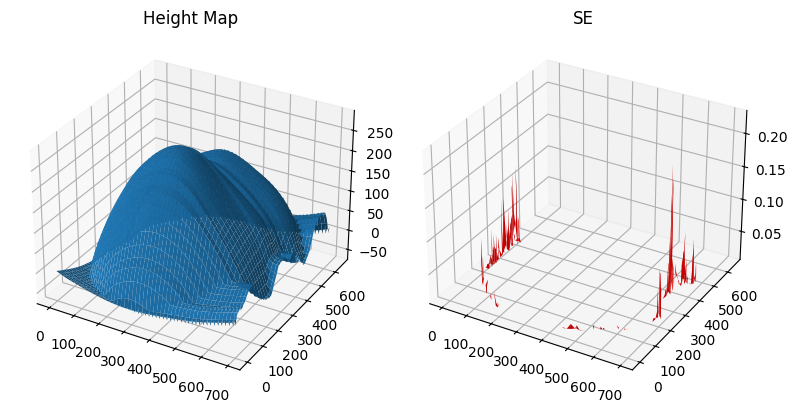

Albedo shape: (696, 646)


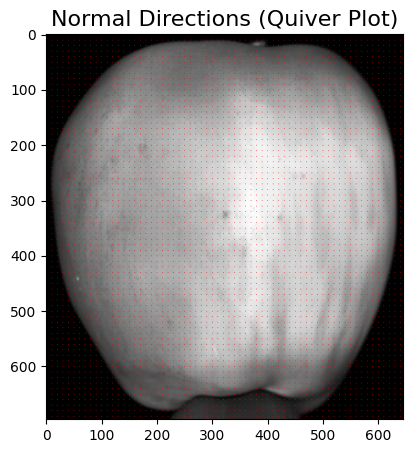

Average Results
Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 2709

Computing surface height map...

Displaying results...

Albedo shape: (696, 646)


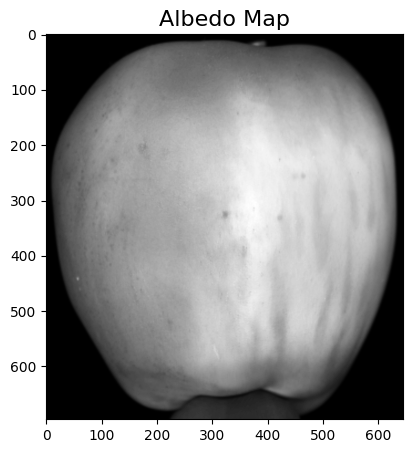

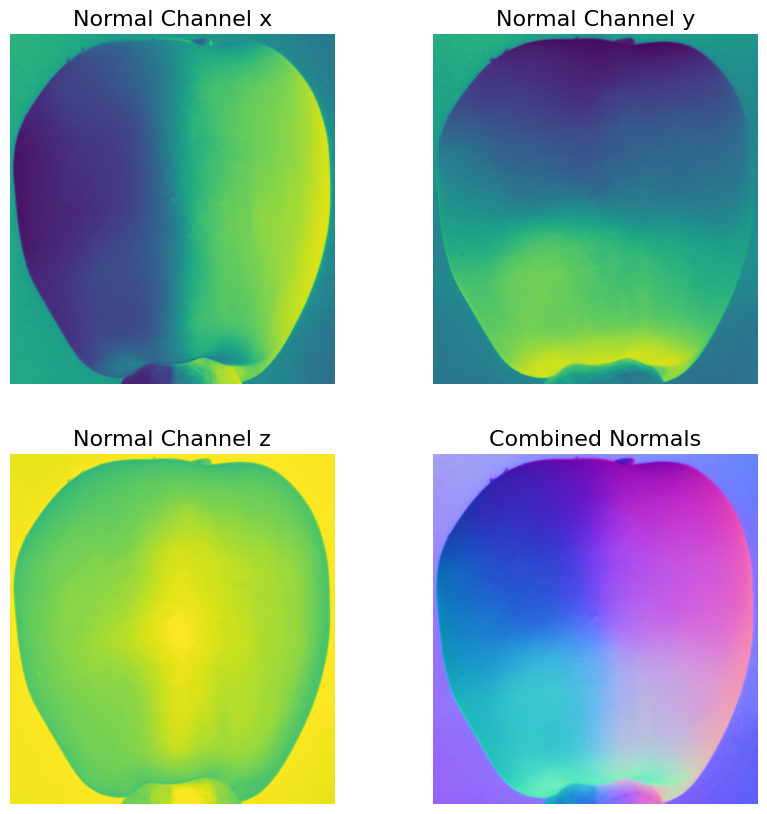

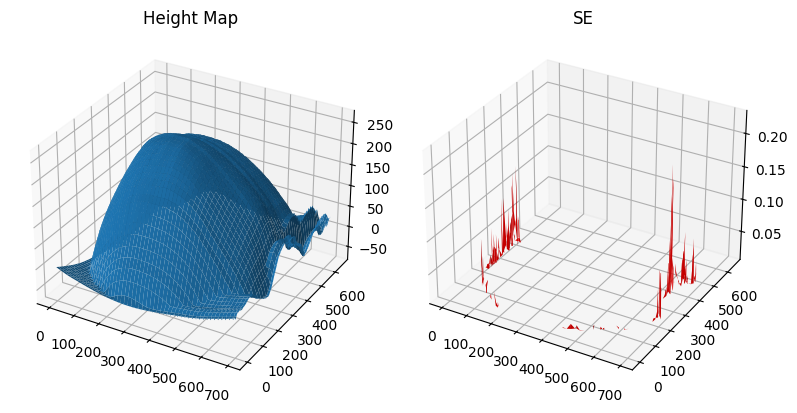

Albedo shape: (696, 646)


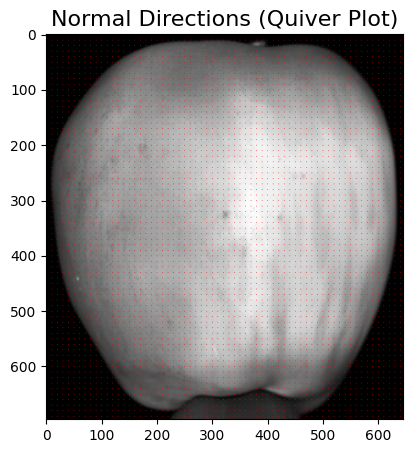

MSE (Row vs Column): 3330.605754998715
MSE (Average vs Column): 832.6514387496787
MSE (Average vs Row): 832.651438749679
Mean Integrability Error (Column): 0.03157584506940823
Mean Integrability Error (Row): 0.03157584506940826
Mean Integrability Error (Average): 0.03157584506940825


In [45]:
print("Column Results")
height_map_column, SE_column = photometric_stereo_apple_dataset(path_type='column')

print("Row Results")
height_map_row, SE_row= photometric_stereo_apple_dataset(path_type='row')

print("Average Results")
height_map_average, SE_average = photometric_stereo_apple_dataset(path_type='average')

# Numerical comparison of height maps
mse_row_vs_column = np.nanmean((height_map_row - height_map_column) ** 2)
mse_average_vs_column = np.nanmean((height_map_average - height_map_column) ** 2)
mse_average_vs_row = np.nanmean((height_map_average - height_map_row) ** 2)

print(f"MSE (Row vs Column): {mse_row_vs_column}")
print(f"MSE (Average vs Column): {mse_average_vs_column}")
print(f"MSE (Average vs Row): {mse_average_vs_row}")

# Compare integrability errors
mean_SE_column = np.nanmean(SE_column)
mean_SE_row = np.nanmean(SE_row)
mean_SE_average = np.nanmean(SE_average)

print(f"Mean Integrability Error (Column): {mean_SE_column}")
print(f"Mean Integrability Error (Row): {mean_SE_row}")
print(f"Mean Integrability Error (Average): {mean_SE_average}")

<a id="question-37"></a>
#### <font color='#FF0000'>Question 37 (1 point)</font>

Observe and discuss the results for different integration paths in the `photometric_stereo_apple_dataset` function.

##### <font color='yellow'>Answer:</font>

Following the same trend we saw before, the difference between the row and column-path is the highest, indicating these paths produce the most different results. The averaging path remains the most consistent one among the three since in combines the information from the other two, balancing the result.

From this example, for real-world data from RGB datasets it is extremely beneficial to use the average path since the integration path has a big impact on the reconstructed surface, and the row and column-paths can introduce more errors.

Additionally, real-world datasets introduce more variability, as we can see from the increased MSE values. This shows how complicated applying the shape-from-shading method can be, since we are making ideal-situation assumptions.

<a id="section-x"></a>
### **Section X: Individual Contribution Report *(Mandatory)***

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.

| Name | Contribution on Research | Contribution on Programming | Contribution on Writing |
| -------- | ------- | ------- | ------- |
| Jose Garcia  | 33.3% | 33.3% | 33.3% |
| Lisanne Wallaard  | 33.3% | 33.3% | 33.3% |
| Julio Smidi | 33.3% | 33.3% | 33.3% |

### - End of Notebook -